# GANomaly
- 2020.08.16 : gen 4 / lr 1e-5

# 개발일지
- 2020.08.15 : 분율 추출 구현 / 이상치 상관계수 추출 구현 / 모델 save, load 구현
- 2020.08.16 : anomaly detect 이미지 저장 구현 / 티타늄(Ti64) 상대 밀도 계산 구현

--- 

# Module

In [1]:
import torch
import torch.nn as nn
import torchvision
from torchvision import transforms
from torchvision.utils import save_image
import os
import numpy as np

import torchvision.datasets as dataset
import torchvision.transforms as transforms
import torchvision.utils as vutils

# Graph & Animation
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# Hyper Parameter

In [2]:
latent_size = 100  # z벡터의 잠재공간(latent space)의 크기
workers = 4    # 0일때, 약 20% 사용 4일 경우 메모리 100%
img_size = 64
channel = 1
epochs = 100
batch_size = 64
learning_rate = 1e-5

# Data and Device

In [3]:
# 이미지 경로, 이미지들 리사이즈 및 텐서형태로 만들기
#data_root = "../../dataset/train"
CFRP_aug_data_root = "../../dataset/aug_train/aug_CFRP"

data_set = dataset.ImageFolder(root = CFRP_aug_data_root, # data_root,
                           transform = transforms.Compose([
                                  #transforms.Resize(img_size),
                                  transforms.CenterCrop(img_size),
                                  torchvision.transforms.Grayscale(channel),
                                  transforms.ToTensor(),
                                  transforms.Normalize((0.5,),(0.5,))
                              ]))

print("size of dataset :", len(data_set))

# 배치로 나누고 셔플하기
data_loader = torch.utils.data.DataLoader(data_set, batch_size = batch_size,
                                         shuffle = True, num_workers = workers, drop_last=True)

# Device setting (GPU or CPU)
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print("device :", device)

size of dataset : 1368
device : cuda:0


# MODEL

In [4]:
# GANomaly : Generative Adversarial Networks Model using Decoder with AutoEncoder

# === Decoder 모델 ===
class Decoder(nn.Module):
    def __init__(self):
        super(Decoder,self).__init__()
        
        # Batch Normalization 유무에 따른 G_block 정의
        def DC_conv_block(in_features, out_features):
            block = [
                    nn.Conv2d(in_features, out_features, 3, 1, 1, bias=False),
                    nn.BatchNorm2d(out_features),
                    nn.ELU()
            ]
            return block
        
        def DC_deconv_block(in_features, out_features, FIRST=True):
            if FIRST:
                block = [
                    nn.ConvTranspose2d(in_features, out_features, 4, 1, 0, bias=False),
                    nn.BatchNorm2d(out_features),
                    nn.ELU()
                ]
            else:
                block = [
                    nn.ConvTranspose2d(in_features, out_features, 4, 2, 1, bias=False),
                    nn.BatchNorm2d(out_features),
                    nn.ELU()
                ]
            return block
        
        
        # ======================= 픽셀 분포 생성 layer ======================= 
        self.DC_gen_distribution = nn.Sequential(
            # ------ input is latent_size 100 ------ 
            *DC_deconv_block(latent_size, img_size*8, FIRST=True),
            # ------ state size is 512x4x4 ------ 
            *DC_conv_block(img_size*8, img_size*8),
            # ------ state size is 512x4x4 ------   
            *DC_deconv_block(img_size*8, img_size*4, FIRST=False),
            # ------ state size is 256x8x8 ------ 
            *DC_conv_block(img_size*4, img_size*4),
            # ------ state size is 256x8x8 ------ 
            *DC_deconv_block(img_size*4, img_size*2, FIRST=False),
            # ------ state size is 128x16x16 ------ 
            *DC_conv_block(img_size*2, img_size*2),
            # ------ state size is 128x16x16 ------ 
            *DC_deconv_block(img_size*2, img_size, FIRST=False),
        )
        
        # =================== 가짜 이미지 생성 layer =================== 
        self.DC_gen_fake_img = nn.Sequential(
            # ------ state size is 64x32x32 ------ 
            nn.ConvTranspose2d(img_size, 1, 4, 2, 1, bias=False),
            nn.Tanh() # 픽셀값의 범위 : -1 ~ 1로 두기 위해서
            # ------ state size is 1x64x64 ------ 
        )
    
    def forward(self, input):
        distribution = self.DC_gen_distribution(input)
        fake_img = self.DC_gen_fake_img(distribution)
        
        return fake_img


# === Discriminator 모델 ===
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        
        # Batch Normalization 유무에 따른 D_block 정의
        def D_block(in_features, out_features, MP=True):
            if MP:
                block = [
                    nn.Conv2d(in_features, out_features, 3, 1, 1, bias=False),
                    nn.BatchNorm2d(out_features),
                    nn.ELU()
                ]
            else:
                block = [
                    nn.Conv2d(in_features, out_features, 3, 1, 1, bias=False),
                    nn.BatchNorm2d(out_features),
                    nn.ELU(),
                    nn.MaxPool2d(2)
                ]
            return block
        
        # ============== Feature 추출 layer ==============
        self.D_extract_feature = nn.Sequential(
            # ------ input is 1 x 64 x 64 ------ 
            *D_block(channel, img_size, MP=False),
            # ------ input is 64 x 64 x 64 ------ 
            *D_block(img_size, img_size, MP=True),
            # ------ state is 64 x 32 x 32 ------ 
            *D_block(img_size, img_size*2, MP=False),
            # ------ state is 128 x 32 x 32 ------ 
            *D_block(img_size*2, img_size*2, MP=True),
            # ------ state is 128 x 16 x 16 ------ 
            *D_block(img_size*2, img_size*4, MP=False),
            # ------ state is 256 x 16 x 16 ------ 
            *D_block(img_size*4, img_size*4, MP=True),
            # ------ state is 256 x 8 x 8 ------ 
            *D_block(img_size*4, img_size*8, MP=False),
            # ------ state is 512 x 8 x 8 ------ 
            *D_block(img_size*8, img_size*8, MP=True),
        )
        
        # ===================== 이진 분류 layer =====================
        self.D_classification = nn.Sequential(        
            # ------- state size 512x4x4 ------- 
            nn.Conv2d(img_size*8, channel, 4, 1, 0, bias=False),
            #nn.Linear(fms*8*4*4, 1, bias=False),
            nn.Sigmoid()        
        )
        
    def forward(self, input):
        feature = self.D_extract_feature(input)
        classification = self.D_classification(feature)
        
        return classification, feature 


# === Encoder Model ===
class Encoder(nn.Module):
    def __init__(self):
        super(Encoder, self).__init__()
        
        def EC_block(in_features, out_features, MP=True):
            if MP:
                block = [
                    nn.Conv2d(in_features, out_features, 3, 1, 1, bias=False),
                    nn.BatchNorm2d(out_features),
                    nn.ELU()
                ]
            else:
                block = [
                    nn.Conv2d(in_features, out_features, 3, 1, 1, bias=False),
                    nn.BatchNorm2d(out_features),
                    nn.ELU(),
                    nn.MaxPool2d(2)
                ]
            return block
        
        # ============== Feature 추출 ==============
        self.EC_extract_feature = nn.Sequential(
            # ------ input is 1 x 64 x 64 ------ 
            *EC_block(channel, img_size, MP=False),
            # ------ input is 64 x 64 x 64 ------ 
            *EC_block(img_size, img_size, MP=True),
            # ------ state is 64 x 32 x 32 ------ 
            *EC_block(img_size, img_size*2, MP=False),
            # ------ state is 128 x 32 x 32 ------ 
            *EC_block(img_size*2, img_size*2, MP=True),
            # ------ state is 128 x 16 x 16 ------ 
            *EC_block(img_size*2, img_size*4, MP=False),
            # ------ state is 256 x 16 x 16 ------ 
            *EC_block(img_size*4, img_size*4, MP=True),
            # ------ state is 256 x 8 x 8 ------ 
            *EC_block(img_size*4, img_size*8, MP=False),
            # ------ state is 512 x 8 x 8 ------ 
            *EC_block(img_size*8, img_size*8, MP=True),
        )
        
        # =============== Encoder Training layer ===============
        self.EC_validate = nn.Sequential(
            # -------state is 512 x 4 x 4-------
            nn.Conv2d(img_size*8, latent_size, 4, 1, 0, bias=False),
            nn.Tanh()
            # -------state is 100 x 97 x 97-------
        )
        
    def forward(self, input):
        feature = self.EC_extract_feature(input)
        validity = self.EC_validate(feature)
        
        return validity

# Loss & Optim

In [5]:
# DC and D 무게 초기화, classname 에 찾는 name가 없다면 -1 ,
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
        nn.init.constant_(m.bias.data, 0)


# D,DC,EC 네트워크 모델 객체 선언
D = Discriminator().to(device)
DC = Decoder().to(device)
EC = Encoder().to(device)

# weight initialize/ nn.Module 클래스 안에 apply 함수가 정의되 있음, 각 함수들에 다 적용 하게한다
D.apply(weights_init)
DC.apply(weights_init)
EC.apply(weights_init)

# Binary cross entropy loss and optimizer
DCGAN_criterion = nn.BCELoss()
AE_criterion = nn.MSELoss()

# latent vector에 배치 사이즈 64를 적용
# 학습한 DC로 새로운 것 만들어서 결과 확인 할때 사용
noise_z = torch.randn(img_size, latent_size, 1, 1, device = device)

# D와 DC에 대해 두가지 최적화 설정
D_optimizer = torch.optim.Adam(D.parameters(), lr = learning_rate, betas=(0.5,0.999))
DC_optimizer = torch.optim.Adam(DC.parameters(), lr = learning_rate, betas=(0.5,0.999))
EC_optimizer = torch.optim.Adam(EC.parameters(), lr = learning_rate, betas=(0.5,0.999))

#print(D)
#print(DC)
#print(EC)

def reset_grad():
    D_optimizer.zero_grad()
    DC_optimizer.zero_grad()

---

# Train DCGAN

In [6]:
img_list = []
DC_losses = []
D_losses = []
iters = 0

def train_DCGAN(epoch, learning_DC_per_D = 4):
    global epochs
    global iters
    
    # 인덱스 0부터 세기 시작
    # data[0].size():64x1x64x64(image) / data[1].size():64(label)
    for i,data in enumerate(data_loader,0):
        
        # Train D
        real_img = data[0].to(device) # image size: 64x1x64x64(batch, channel, width, height)
        b_size = real_img.size(0) # b_size = 64
        real_labels = torch.ones(b_size, 1).to(device)
        fake_labels = torch.zeros(b_size, 1).to(device)
        
        # (--------------------------real-----------------------------)
        real_classification, _ = D(real_img) # output = D(x)
        real_loss = DCGAN_criterion(real_classification, real_labels) # D(x)=1일 때의 loss
        real_score = real_classification
        D_x = real_score.mean().item() 
            
        # (--------------------------fake-----------------------------)
        z = torch.randn(b_size, latent_size, 1, 1).to(device) # z size :64x100x1x1
        fake_img = DC(z)
        fake_classification, _ = D(fake_img) # output = D(DC(z))
        fake_loss = DCGAN_criterion(fake_classification, fake_labels) # D(DC(z))=0일 때의 loss
        fake_score = fake_classification
        D_DC_z1 = fake_score.mean().item()

        # (------------------Backprop and optimize---------------------)
        D_loss = real_loss + fake_loss
        reset_grad()
        D_loss.backward()
        D_optimizer.step() # D(x)=1, D(DC(z))=0이어야 D가 최적

        
        # Train DC
        #z = torch.randn(b_size,latent_size,1,1,device=device) # z size :64x100x1x1
        for k in range(learning_DC_per_D):
            fake_img = DC(z)
            fake_classification,_ = D(fake_img)  # output : D(DC(z))
            D_DC_z2 = fake_classification.mean().item()
            DC_loss = DCGAN_criterion(fake_classification, real_labels) # D(DC(z))=1일 때의 loss=log(D(DC(z)))

            # (------------------Backprop and optimize---------------------)
            reset_grad()
            DC_loss.backward()
            DC_optimizer.step() # D(DC(z))=1 이어야 DC가 최적
            # ==> D(DC(z))의 값이 0.5로 수렴해야 한다.
        
        
        # print
        print('[%d/%d][%d/%d]\n- D_loss : %.4f / DC_loss : %.4f\n- D(x):%.4f / D(DC(z1)) : %.4f / D(DC(z2)) : %.4f' 
                   %(epoch+1, epochs, i, len(data_loader),D_loss.item(),
                     DC_loss.item(),D_x,D_DC_z1,D_DC_z2))
        
        # Save Losses for plotting later
        DC_losses.append(DC_loss.item())
        D_losses.append(D_loss.item())
        
        #Check how the generator is doing by saving G's output on noise_z
        if (iters % 500 == 0) or ((epoch == epochs-1) and (i == len(data_loader)-1)):
            with torch.no_grad():
                fake = DC(noise_z).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
            
        iters += 1
        
#torch.save(E.state_dict(), 'E.ckpt')

In [7]:
for epoch in range(epochs):
    train_DCGAN(epoch, learning_DC_per_D = 4)

/home/piai/anaconda3/envs/pytorch/lib/python3.6/site-packages/torch/nn/modules/loss.py:498: UserWarning: Using a target size (torch.Size([64, 1])) that is different to the input size (torch.Size([64, 1, 1, 1])) is deprecated. Please ensure they have the same size.
  return F.binary_cross_entropy(input, target, weight=self.weight, reduction=self.reduction)


[1/100][0/21]
- D_loss : 1.3824 / DC_loss : 0.6907
- D(x):0.4963 / D(DC(z1)) : 0.4942 / D(DC(z2)) : 0.5013
[1/100][1/21]
- D_loss : 1.3747 / DC_loss : 0.7004
- D(x):0.4966 / D(DC(z1)) : 0.4906 / D(DC(z2)) : 0.4964
[1/100][2/21]
- D_loss : 1.3687 / DC_loss : 0.7071
- D(x):0.4959 / D(DC(z1)) : 0.4868 / D(DC(z2)) : 0.4931
[1/100][3/21]
- D_loss : 1.3613 / DC_loss : 0.7174
- D(x):0.4946 / D(DC(z1)) : 0.4816 / D(DC(z2)) : 0.4881
[1/100][4/21]
- D_loss : 1.3483 / DC_loss : 0.7258
- D(x):0.4969 / D(DC(z1)) : 0.4773 / D(DC(z2)) : 0.4840
[1/100][5/21]
- D_loss : 1.3457 / DC_loss : 0.7307
- D(x):0.4956 / D(DC(z1)) : 0.4746 / D(DC(z2)) : 0.4816
[1/100][6/21]
- D_loss : 1.3355 / DC_loss : 0.7385
- D(x):0.4969 / D(DC(z1)) : 0.4706 / D(DC(z2)) : 0.4779
[1/100][7/21]
- D_loss : 1.3339 / DC_loss : 0.7479
- D(x):0.4937 / D(DC(z1)) : 0.4663 / D(DC(z2)) : 0.4734
[1/100][8/21]
- D_loss : 1.3235 / DC_loss : 0.7552
- D(x):0.4956 / D(DC(z1)) : 0.4628 / D(DC(z2)) : 0.4699
[1/100][9/21]
- D_loss : 1.3169 / DC_

[4/100][14/21]
- D_loss : 1.2730 / DC_loss : 0.7863
- D(x):0.5137 / D(DC(z1)) : 0.4522 / D(DC(z2)) : 0.4584
[4/100][15/21]
- D_loss : 1.2486 / DC_loss : 0.7931
- D(x):0.5220 / D(DC(z1)) : 0.4479 / D(DC(z2)) : 0.4549
[4/100][16/21]
- D_loss : 1.2735 / DC_loss : 0.7808
- D(x):0.5142 / D(DC(z1)) : 0.4534 / D(DC(z2)) : 0.4602
[4/100][17/21]
- D_loss : 1.2613 / DC_loss : 0.7794
- D(x):0.5219 / D(DC(z1)) : 0.4549 / D(DC(z2)) : 0.4608
[4/100][18/21]
- D_loss : 1.2633 / DC_loss : 0.7766
- D(x):0.5206 / D(DC(z1)) : 0.4549 / D(DC(z2)) : 0.4613
[4/100][19/21]
- D_loss : 1.2829 / DC_loss : 0.7627
- D(x):0.5189 / D(DC(z1)) : 0.4636 / D(DC(z2)) : 0.4677
[4/100][20/21]
- D_loss : 1.2699 / DC_loss : 0.7715
- D(x):0.5225 / D(DC(z1)) : 0.4613 / D(DC(z2)) : 0.4630
[5/100][0/21]
- D_loss : 1.2677 / DC_loss : 0.7777
- D(x):0.5241 / D(DC(z1)) : 0.4618 / D(DC(z2)) : 0.4599
[5/100][1/21]
- D_loss : 1.2760 / DC_loss : 0.7926
- D(x):0.5148 / D(DC(z1)) : 0.4569 / D(DC(z2)) : 0.4529
[5/100][2/21]
- D_loss : 1.249

[8/100][7/21]
- D_loss : 0.9411 / DC_loss : 1.1089
- D(x):0.5882 / D(DC(z1)) : 0.3352 / D(DC(z2)) : 0.3301
[8/100][8/21]
- D_loss : 0.9088 / DC_loss : 1.1191
- D(x):0.6043 / D(DC(z1)) : 0.3316 / D(DC(z2)) : 0.3268
[8/100][9/21]
- D_loss : 0.9108 / DC_loss : 1.1207
- D(x):0.6036 / D(DC(z1)) : 0.3315 / D(DC(z2)) : 0.3262
[8/100][10/21]
- D_loss : 0.9202 / DC_loss : 1.1329
- D(x):0.5941 / D(DC(z1)) : 0.3276 / D(DC(z2)) : 0.3223
[8/100][11/21]
- D_loss : 0.9142 / DC_loss : 1.1395
- D(x):0.5966 / D(DC(z1)) : 0.3261 / D(DC(z2)) : 0.3202
[8/100][12/21]
- D_loss : 0.9016 / DC_loss : 1.1532
- D(x):0.6013 / D(DC(z1)) : 0.3224 / D(DC(z2)) : 0.3158
[8/100][13/21]
- D_loss : 0.9257 / DC_loss : 1.1606
- D(x):0.5843 / D(DC(z1)) : 0.3197 / D(DC(z2)) : 0.3135
[8/100][14/21]
- D_loss : 0.8810 / DC_loss : 1.1742
- D(x):0.6065 / D(DC(z1)) : 0.3148 / D(DC(z2)) : 0.3093
[8/100][15/21]
- D_loss : 0.8883 / DC_loss : 1.1756
- D(x):0.6010 / D(DC(z1)) : 0.3134 / D(DC(z2)) : 0.3088
[8/100][16/21]
- D_loss : 0.870

[11/100][20/21]
- D_loss : 0.5966 / DC_loss : 1.5290
- D(x):0.7083 / D(DC(z1)) : 0.2208 / D(DC(z2)) : 0.2168
[12/100][0/21]
- D_loss : 0.5869 / DC_loss : 1.5321
- D(x):0.7148 / D(DC(z1)) : 0.2200 / D(DC(z2)) : 0.2161
[12/100][1/21]
- D_loss : 0.5973 / DC_loss : 1.5384
- D(x):0.7073 / D(DC(z1)) : 0.2190 / D(DC(z2)) : 0.2148
[12/100][2/21]
- D_loss : 0.5894 / DC_loss : 1.5465
- D(x):0.7123 / D(DC(z1)) : 0.2180 / D(DC(z2)) : 0.2131
[12/100][3/21]
- D_loss : 0.5870 / DC_loss : 1.5617
- D(x):0.7108 / D(DC(z1)) : 0.2152 / D(DC(z2)) : 0.2098
[12/100][4/21]
- D_loss : 0.5706 / DC_loss : 1.5745
- D(x):0.7198 / D(DC(z1)) : 0.2127 / D(DC(z2)) : 0.2072
[12/100][5/21]
- D_loss : 0.5698 / DC_loss : 1.5858
- D(x):0.7179 / D(DC(z1)) : 0.2097 / D(DC(z2)) : 0.2048
[12/100][6/21]
- D_loss : 0.5569 / DC_loss : 1.5966
- D(x):0.7262 / D(DC(z1)) : 0.2074 / D(DC(z2)) : 0.2027
[12/100][7/21]
- D_loss : 0.5471 / DC_loss : 1.6092
- D(x):0.7295 / D(DC(z1)) : 0.2046 / D(DC(z2)) : 0.2001
[12/100][8/21]
- D_loss : 0

[15/100][12/21]
- D_loss : 0.4077 / DC_loss : 1.7879
- D(x):0.8036 / D(DC(z1)) : 0.1710 / D(DC(z2)) : 0.1679
[15/100][13/21]
- D_loss : 0.3875 / DC_loss : 1.7942
- D(x):0.8199 / D(DC(z1)) : 0.1705 / D(DC(z2)) : 0.1669
[15/100][14/21]
- D_loss : 0.3821 / DC_loss : 1.8009
- D(x):0.8235 / D(DC(z1)) : 0.1696 / D(DC(z2)) : 0.1656
[15/100][15/21]
- D_loss : 0.3913 / DC_loss : 1.8077
- D(x):0.8145 / D(DC(z1)) : 0.1680 / D(DC(z2)) : 0.1645
[15/100][16/21]
- D_loss : 0.3915 / DC_loss : 1.8106
- D(x):0.8135 / D(DC(z1)) : 0.1676 / D(DC(z2)) : 0.1642
[15/100][17/21]
- D_loss : 0.3721 / DC_loss : 1.8165
- D(x):0.8284 / D(DC(z1)) : 0.1668 / D(DC(z2)) : 0.1634
[15/100][18/21]
- D_loss : 0.3763 / DC_loss : 1.8241
- D(x):0.8236 / D(DC(z1)) : 0.1651 / D(DC(z2)) : 0.1620
[15/100][19/21]
- D_loss : 0.3573 / DC_loss : 1.8276
- D(x):0.8385 / D(DC(z1)) : 0.1647 / D(DC(z2)) : 0.1614
[15/100][20/21]
- D_loss : 0.3863 / DC_loss : 1.8294
- D(x):0.8141 / D(DC(z1)) : 0.1638 / D(DC(z2)) : 0.1612
[16/100][0/21]
- D_

[19/100][4/21]
- D_loss : 0.2660 / DC_loss : 2.0297
- D(x):0.8827 / D(DC(z1)) : 0.1312 / D(DC(z2)) : 0.1314
[19/100][5/21]
- D_loss : 0.2684 / DC_loss : 2.0175
- D(x):0.8840 / D(DC(z1)) : 0.1344 / D(DC(z2)) : 0.1330
[19/100][6/21]
- D_loss : 0.2686 / DC_loss : 2.0227
- D(x):0.8854 / D(DC(z1)) : 0.1357 / D(DC(z2)) : 0.1323
[19/100][7/21]
- D_loss : 0.2662 / DC_loss : 2.0409
- D(x):0.8866 / D(DC(z1)) : 0.1348 / D(DC(z2)) : 0.1299
[19/100][8/21]
- D_loss : 0.2551 / DC_loss : 2.0639
- D(x):0.8933 / D(DC(z1)) : 0.1321 / D(DC(z2)) : 0.1270
[19/100][9/21]
- D_loss : 0.2521 / DC_loss : 2.0884
- D(x):0.8925 / D(DC(z1)) : 0.1288 / D(DC(z2)) : 0.1239
[19/100][10/21]
- D_loss : 0.2494 / DC_loss : 2.1120
- D(x):0.8916 / D(DC(z1)) : 0.1255 / D(DC(z2)) : 0.1210
[19/100][11/21]
- D_loss : 0.2545 / DC_loss : 2.1302
- D(x):0.8843 / D(DC(z1)) : 0.1225 / D(DC(z2)) : 0.1188
[19/100][12/21]
- D_loss : 0.2477 / DC_loss : 2.1445
- D(x):0.8877 / D(DC(z1)) : 0.1202 / D(DC(z2)) : 0.1171
[19/100][13/21]
- D_loss 

[22/100][17/21]
- D_loss : 0.1935 / DC_loss : 2.3789
- D(x):0.9092 / D(DC(z1)) : 0.0934 / D(DC(z2)) : 0.0927
[22/100][18/21]
- D_loss : 0.1866 / DC_loss : 2.3820
- D(x):0.9153 / D(DC(z1)) : 0.0931 / D(DC(z2)) : 0.0924
[22/100][19/21]
- D_loss : 0.1844 / DC_loss : 2.3840
- D(x):0.9170 / D(DC(z1)) : 0.0929 / D(DC(z2)) : 0.0922
[22/100][20/21]
- D_loss : 0.1874 / DC_loss : 2.3845
- D(x):0.9143 / D(DC(z1)) : 0.0928 / D(DC(z2)) : 0.0921
[23/100][0/21]
- D_loss : 0.1812 / DC_loss : 2.3870
- D(x):0.9197 / D(DC(z1)) : 0.0926 / D(DC(z2)) : 0.0919
[23/100][1/21]
- D_loss : 0.1774 / DC_loss : 2.3858
- D(x):0.9232 / D(DC(z1)) : 0.0926 / D(DC(z2)) : 0.0920
[23/100][2/21]
- D_loss : 0.1780 / DC_loss : 2.3835
- D(x):0.9229 / D(DC(z1)) : 0.0928 / D(DC(z2)) : 0.0922
[23/100][3/21]
- D_loss : 0.1790 / DC_loss : 2.3777
- D(x):0.9224 / D(DC(z1)) : 0.0933 / D(DC(z2)) : 0.0928
[23/100][4/21]
- D_loss : 0.1806 / DC_loss : 2.3656
- D(x):0.9217 / D(DC(z1)) : 0.0942 / D(DC(z2)) : 0.0939
[23/100][5/21]
- D_loss 

[26/100][9/21]
- D_loss : 0.1332 / DC_loss : 2.7489
- D(x):0.9354 / D(DC(z1)) : 0.0641 / D(DC(z2)) : 0.0640
[26/100][10/21]
- D_loss : 0.1289 / DC_loss : 2.7593
- D(x):0.9396 / D(DC(z1)) : 0.0642 / D(DC(z2)) : 0.0633
[26/100][11/21]
- D_loss : 0.1250 / DC_loss : 2.7755
- D(x):0.9425 / D(DC(z1)) : 0.0635 / D(DC(z2)) : 0.0623
[26/100][12/21]
- D_loss : 0.1291 / DC_loss : 2.7850
- D(x):0.9376 / D(DC(z1)) : 0.0625 / D(DC(z2)) : 0.0617
[26/100][13/21]
- D_loss : 0.1289 / DC_loss : 2.7848
- D(x):0.9373 / D(DC(z1)) : 0.0619 / D(DC(z2)) : 0.0617
[26/100][14/21]
- D_loss : 0.1278 / DC_loss : 2.7848
- D(x):0.9382 / D(DC(z1)) : 0.0619 / D(DC(z2)) : 0.0617
[26/100][15/21]
- D_loss : 0.1248 / DC_loss : 2.7865
- D(x):0.9411 / D(DC(z1)) : 0.0619 / D(DC(z2)) : 0.0616
[26/100][16/21]
- D_loss : 0.1297 / DC_loss : 2.7850
- D(x):0.9364 / D(DC(z1)) : 0.0618 / D(DC(z2)) : 0.0617
[26/100][17/21]
- D_loss : 0.1247 / DC_loss : 2.7854
- D(x):0.9412 / D(DC(z1)) : 0.0619 / D(DC(z2)) : 0.0617
[26/100][18/21]
- D_

[30/100][1/21]
- D_loss : 0.1529 / DC_loss : 2.4035
- D(x):0.9528 / D(DC(z1)) : 0.0993 / D(DC(z2)) : 0.0904
[30/100][2/21]
- D_loss : 0.1469 / DC_loss : 2.4660
- D(x):0.9530 / D(DC(z1)) : 0.0940 / D(DC(z2)) : 0.0850
[30/100][3/21]
- D_loss : 0.1406 / DC_loss : 2.5247
- D(x):0.9521 / D(DC(z1)) : 0.0874 / D(DC(z2)) : 0.0801
[30/100][4/21]
- D_loss : 0.1333 / DC_loss : 2.5645
- D(x):0.9536 / D(DC(z1)) : 0.0821 / D(DC(z2)) : 0.0770
[30/100][5/21]
- D_loss : 0.1287 / DC_loss : 2.5915
- D(x):0.9545 / D(DC(z1)) : 0.0788 / D(DC(z2)) : 0.0749
[30/100][6/21]
- D_loss : 0.1282 / DC_loss : 2.6048
- D(x):0.9527 / D(DC(z1)) : 0.0765 / D(DC(z2)) : 0.0739
[30/100][7/21]
- D_loss : 0.1250 / DC_loss : 2.5983
- D(x):0.9548 / D(DC(z1)) : 0.0757 / D(DC(z2)) : 0.0744
[30/100][8/21]
- D_loss : 0.1277 / DC_loss : 2.5741
- D(x):0.9530 / D(DC(z1)) : 0.0764 / D(DC(z2)) : 0.0762
[30/100][9/21]
- D_loss : 0.1289 / DC_loss : 2.5327
- D(x):0.9543 / D(DC(z1)) : 0.0788 / D(DC(z2)) : 0.0795
[30/100][10/21]
- D_loss : 0

[33/100][14/21]
- D_loss : 0.1003 / DC_loss : 2.9149
- D(x):0.9573 / D(DC(z1)) : 0.0550 / D(DC(z2)) : 0.0542
[33/100][15/21]
- D_loss : 0.0974 / DC_loss : 2.9237
- D(x):0.9596 / D(DC(z1)) : 0.0545 / D(DC(z2)) : 0.0537
[33/100][16/21]
- D_loss : 0.0989 / DC_loss : 2.9321
- D(x):0.9576 / D(DC(z1)) : 0.0540 / D(DC(z2)) : 0.0533
[33/100][17/21]
- D_loss : 0.0982 / DC_loss : 2.9409
- D(x):0.9578 / D(DC(z1)) : 0.0535 / D(DC(z2)) : 0.0528
[33/100][18/21]
- D_loss : 0.0955 / DC_loss : 2.9488
- D(x):0.9599 / D(DC(z1)) : 0.0531 / D(DC(z2)) : 0.0524
[33/100][19/21]
- D_loss : 0.0932 / DC_loss : 2.9559
- D(x):0.9617 / D(DC(z1)) : 0.0527 / D(DC(z2)) : 0.0520
[33/100][20/21]
- D_loss : 0.0928 / DC_loss : 2.9625
- D(x):0.9617 / D(DC(z1)) : 0.0523 / D(DC(z2)) : 0.0517
[34/100][0/21]
- D_loss : 0.0946 / DC_loss : 2.9670
- D(x):0.9596 / D(DC(z1)) : 0.0519 / D(DC(z2)) : 0.0515
[34/100][1/21]
- D_loss : 0.0933 / DC_loss : 2.9717
- D(x):0.9607 / D(DC(z1)) : 0.0517 / D(DC(z2)) : 0.0512
[34/100][2/21]
- D_lo

[37/100][6/21]
- D_loss : 0.6387 / DC_loss : 2.5845
- D(x):0.9184 / D(DC(z1)) : 0.4242 / D(DC(z2)) : 0.0754
[37/100][7/21]
- D_loss : 0.2610 / DC_loss : 2.9406
- D(x):0.8400 / D(DC(z1)) : 0.0791 / D(DC(z2)) : 0.0528
[37/100][8/21]
- D_loss : 0.5541 / DC_loss : 1.9709
- D(x):0.6214 / D(DC(z1)) : 0.0538 / D(DC(z2)) : 0.1393
[37/100][9/21]
- D_loss : 0.3067 / DC_loss : 1.4285
- D(x):0.8682 / D(DC(z1)) : 0.1506 / D(DC(z2)) : 0.2397
[37/100][10/21]
- D_loss : 0.4387 / DC_loss : 2.0912
- D(x):0.8802 / D(DC(z1)) : 0.2660 / D(DC(z2)) : 0.1235
[37/100][11/21]
- D_loss : 0.3222 / DC_loss : 2.5052
- D(x):0.8401 / D(DC(z1)) : 0.1339 / D(DC(z2)) : 0.0817
[37/100][12/21]
- D_loss : 0.3193 / DC_loss : 2.3517
- D(x):0.8064 / D(DC(z1)) : 0.0866 / D(DC(z2)) : 0.0952
[37/100][13/21]
- D_loss : 0.2874 / DC_loss : 2.0786
- D(x):0.8403 / D(DC(z1)) : 0.1027 / D(DC(z2)) : 0.1251
[37/100][14/21]
- D_loss : 0.3111 / DC_loss : 2.0513
- D(x):0.8550 / D(DC(z1)) : 0.1402 / D(DC(z2)) : 0.1286
[37/100][15/21]
- D_los

[40/100][19/21]
- D_loss : 0.2628 / DC_loss : 2.0044
- D(x):0.8905 / D(DC(z1)) : 0.1350 / D(DC(z2)) : 0.1348
[40/100][20/21]
- D_loss : 0.3186 / DC_loss : 1.9318
- D(x):0.8636 / D(DC(z1)) : 0.1434 / D(DC(z2)) : 0.1449
[41/100][0/21]
- D_loss : 0.2764 / DC_loss : 1.8729
- D(x):0.8994 / D(DC(z1)) : 0.1560 / D(DC(z2)) : 0.1537
[41/100][1/21]
- D_loss : 0.3263 / DC_loss : 1.6312
- D(x):0.8755 / D(DC(z1)) : 0.1743 / D(DC(z2)) : 0.1957
[41/100][2/21]
- D_loss : 0.3975 / DC_loss : 1.2865
- D(x):0.9059 / D(DC(z1)) : 0.2574 / D(DC(z2)) : 0.2763
[41/100][3/21]
- D_loss : 0.6730 / DC_loss : 2.0154
- D(x):0.8465 / D(DC(z1)) : 0.3945 / D(DC(z2)) : 0.1333
[41/100][4/21]
- D_loss : 0.9915 / DC_loss : 0.9387
- D(x):0.4614 / D(DC(z1)) : 0.1569 / D(DC(z2)) : 0.3912
[41/100][5/21]
- D_loss : 0.8318 / DC_loss : 1.7882
- D(x):0.8136 / D(DC(z1)) : 0.4590 / D(DC(z2)) : 0.1673
[41/100][6/21]
- D_loss : 0.3667 / DC_loss : 2.5036
- D(x):0.8655 / D(DC(z1)) : 0.1974 / D(DC(z2)) : 0.0818
[41/100][7/21]
- D_loss : 

[44/100][11/21]
- D_loss : 0.1879 / DC_loss : 2.3865
- D(x):0.9130 / D(DC(z1)) : 0.0912 / D(DC(z2)) : 0.0920
[44/100][12/21]
- D_loss : 0.2260 / DC_loss : 2.1647
- D(x):0.8867 / D(DC(z1)) : 0.0991 / D(DC(z2)) : 0.1148
[44/100][13/21]
- D_loss : 0.2930 / DC_loss : 1.7983
- D(x):0.8536 / D(DC(z1)) : 0.1238 / D(DC(z2)) : 0.1656
[44/100][14/21]
- D_loss : 0.2798 / DC_loss : 2.0878
- D(x):0.9238 / D(DC(z1)) : 0.1810 / D(DC(z2)) : 0.1240
[44/100][15/21]
- D_loss : 0.2656 / DC_loss : 2.2293
- D(x):0.8868 / D(DC(z1)) : 0.1336 / D(DC(z2)) : 0.1076
[44/100][16/21]
- D_loss : 0.2457 / DC_loss : 2.2002
- D(x):0.8860 / D(DC(z1)) : 0.1151 / D(DC(z2)) : 0.1108
[44/100][17/21]
- D_loss : 0.3096 / DC_loss : 1.8681
- D(x):0.8371 / D(DC(z1)) : 0.1183 / D(DC(z2)) : 0.1544
[44/100][18/21]
- D_loss : 0.2743 / DC_loss : 2.0292
- D(x):0.9154 / D(DC(z1)) : 0.1690 / D(DC(z2)) : 0.1315
[44/100][19/21]
- D_loss : 0.2224 / DC_loss : 2.3718
- D(x):0.9346 / D(DC(z1)) : 0.1428 / D(DC(z2)) : 0.0933
[44/100][20/21]
- D

[48/100][3/21]
- D_loss : 0.1640 / DC_loss : 2.4291
- D(x):0.9401 / D(DC(z1)) : 0.0970 / D(DC(z2)) : 0.0881
[48/100][4/21]
- D_loss : 0.2334 / DC_loss : 2.3016
- D(x):0.8743 / D(DC(z1)) : 0.0921 / D(DC(z2)) : 0.1001
[48/100][5/21]
- D_loss : 0.3216 / DC_loss : 1.7685
- D(x):0.8141 / D(DC(z1)) : 0.1047 / D(DC(z2)) : 0.1706
[48/100][6/21]
- D_loss : 0.2978 / DC_loss : 2.0758
- D(x):0.9098 / D(DC(z1)) : 0.1814 / D(DC(z2)) : 0.1255
[48/100][7/21]
- D_loss : 0.2015 / DC_loss : 2.5610
- D(x):0.9406 / D(DC(z1)) : 0.1305 / D(DC(z2)) : 0.0772
[48/100][8/21]
- D_loss : 0.1798 / DC_loss : 2.7177
- D(x):0.9087 / D(DC(z1)) : 0.0797 / D(DC(z2)) : 0.0660
[48/100][9/21]
- D_loss : 0.1582 / DC_loss : 2.7391
- D(x):0.9172 / D(DC(z1)) : 0.0676 / D(DC(z2)) : 0.0646
[48/100][10/21]
- D_loss : 0.1848 / DC_loss : 2.6040
- D(x):0.8912 / D(DC(z1)) : 0.0663 / D(DC(z2)) : 0.0740
[48/100][11/21]
- D_loss : 0.1942 / DC_loss : 2.4423
- D(x):0.8932 / D(DC(z1)) : 0.0760 / D(DC(z2)) : 0.0870
[48/100][12/21]
- D_loss :

[51/100][16/21]
- D_loss : 0.2487 / DC_loss : 2.3983
- D(x):0.8558 / D(DC(z1)) : 0.0811 / D(DC(z2)) : 0.0909
[51/100][17/21]
- D_loss : 0.1661 / DC_loss : 2.4690
- D(x):0.9377 / D(DC(z1)) : 0.0962 / D(DC(z2)) : 0.0847
[51/100][18/21]
- D_loss : 0.1938 / DC_loss : 2.5442
- D(x):0.9062 / D(DC(z1)) : 0.0888 / D(DC(z2)) : 0.0785
[51/100][19/21]
- D_loss : 0.1566 / DC_loss : 2.6720
- D(x):0.9324 / D(DC(z1)) : 0.0820 / D(DC(z2)) : 0.0691
[51/100][20/21]
- D_loss : 0.1549 / DC_loss : 2.7474
- D(x):0.9241 / D(DC(z1)) : 0.0718 / D(DC(z2)) : 0.0641
[52/100][0/21]
- D_loss : 0.1334 / DC_loss : 2.8110
- D(x):0.9377 / D(DC(z1)) : 0.0664 / D(DC(z2)) : 0.0601
[52/100][1/21]
- D_loss : 0.1989 / DC_loss : 2.6112
- D(x):0.8760 / D(DC(z1)) : 0.0620 / D(DC(z2)) : 0.0735
[52/100][2/21]
- D_loss : 0.2763 / DC_loss : 2.0230
- D(x):0.8289 / D(DC(z1)) : 0.0758 / D(DC(z2)) : 0.1323
[52/100][3/21]
- D_loss : 0.2255 / DC_loss : 2.1897
- D(x):0.9298 / D(DC(z1)) : 0.1401 / D(DC(z2)) : 0.1120
[52/100][4/21]
- D_loss

[55/100][8/21]
- D_loss : 0.1807 / DC_loss : 2.4951
- D(x):0.9247 / D(DC(z1)) : 0.0958 / D(DC(z2)) : 0.0825
[55/100][9/21]
- D_loss : 0.1717 / DC_loss : 2.6015
- D(x):0.9216 / D(DC(z1)) : 0.0842 / D(DC(z2)) : 0.0742
[55/100][10/21]
- D_loss : 0.2863 / DC_loss : 2.4879
- D(x):0.8352 / D(DC(z1)) : 0.0756 / D(DC(z2)) : 0.0831
[55/100][11/21]
- D_loss : 0.1563 / DC_loss : 2.4954
- D(x):0.9354 / D(DC(z1)) : 0.0849 / D(DC(z2)) : 0.0825
[55/100][12/21]
- D_loss : 0.1848 / DC_loss : 2.5286
- D(x):0.9100 / D(DC(z1)) : 0.0843 / D(DC(z2)) : 0.0798
[55/100][13/21]
- D_loss : 0.1771 / DC_loss : 2.5609
- D(x):0.9194 / D(DC(z1)) : 0.0814 / D(DC(z2)) : 0.0772
[55/100][14/21]
- D_loss : 0.1461 / DC_loss : 2.6511
- D(x):0.9386 / D(DC(z1)) : 0.0788 / D(DC(z2)) : 0.0706
[55/100][15/21]
- D_loss : 0.1827 / DC_loss : 2.6767
- D(x):0.8994 / D(DC(z1)) : 0.0722 / D(DC(z2)) : 0.0688
[55/100][16/21]
- D_loss : 0.1522 / DC_loss : 2.7017
- D(x):0.9249 / D(DC(z1)) : 0.0705 / D(DC(z2)) : 0.0671
[55/100][17/21]
- D_l

[59/100][0/21]
- D_loss : 0.1334 / DC_loss : 2.6565
- D(x):0.9517 / D(DC(z1)) : 0.0803 / D(DC(z2)) : 0.0702
[59/100][1/21]
- D_loss : 0.1149 / DC_loss : 2.7778
- D(x):0.9606 / D(DC(z1)) : 0.0717 / D(DC(z2)) : 0.0622
[59/100][2/21]
- D_loss : 0.1044 / DC_loss : 2.8882
- D(x):0.9624 / D(DC(z1)) : 0.0636 / D(DC(z2)) : 0.0557
[59/100][3/21]
- D_loss : 0.1759 / DC_loss : 2.7849
- D(x):0.8936 / D(DC(z1)) : 0.0568 / D(DC(z2)) : 0.0617
[59/100][4/21]
- D_loss : 0.1102 / DC_loss : 2.7608
- D(x):0.9564 / D(DC(z1)) : 0.0634 / D(DC(z2)) : 0.0632
[59/100][5/21]
- D_loss : 0.1166 / DC_loss : 2.7680
- D(x):0.9525 / D(DC(z1)) : 0.0648 / D(DC(z2)) : 0.0628
[59/100][6/21]
- D_loss : 0.1319 / DC_loss : 2.7538
- D(x):0.9380 / D(DC(z1)) : 0.0645 / D(DC(z2)) : 0.0637
[59/100][7/21]
- D_loss : 0.1734 / DC_loss : 2.6389
- D(x):0.9083 / D(DC(z1)) : 0.0654 / D(DC(z2)) : 0.0714
[59/100][8/21]
- D_loss : 0.1563 / DC_loss : 2.5316
- D(x):0.9242 / D(DC(z1)) : 0.0738 / D(DC(z2)) : 0.0795
[59/100][9/21]
- D_loss : 0.

[62/100][13/21]
- D_loss : 0.1936 / DC_loss : 2.5779
- D(x):0.9141 / D(DC(z1)) : 0.0968 / D(DC(z2)) : 0.0759
[62/100][14/21]
- D_loss : 0.1858 / DC_loss : 2.4387
- D(x):0.9108 / D(DC(z1)) : 0.0866 / D(DC(z2)) : 0.0873
[62/100][15/21]
- D_loss : 0.2338 / DC_loss : 2.0529
- D(x):0.8873 / D(DC(z1)) : 0.1060 / D(DC(z2)) : 0.1284
[62/100][16/21]
- D_loss : 0.2732 / DC_loss : 2.3604
- D(x):0.9105 / D(DC(z1)) : 0.1626 / D(DC(z2)) : 0.0944
[62/100][17/21]
- D_loss : 0.2310 / DC_loss : 2.7691
- D(x):0.9023 / D(DC(z1)) : 0.1127 / D(DC(z2)) : 0.0627
[62/100][18/21]
- D_loss : 0.1375 / DC_loss : 3.0026
- D(x):0.9379 / D(DC(z1)) : 0.0701 / D(DC(z2)) : 0.0497
[62/100][19/21]
- D_loss : 0.1450 / DC_loss : 2.9694
- D(x):0.9158 / D(DC(z1)) : 0.0536 / D(DC(z2)) : 0.0513
[62/100][20/21]
- D_loss : 0.1281 / DC_loss : 2.8748
- D(x):0.9321 / D(DC(z1)) : 0.0550 / D(DC(z2)) : 0.0564
[63/100][0/21]
- D_loss : 0.1253 / DC_loss : 2.8179
- D(x):0.9394 / D(DC(z1)) : 0.0605 / D(DC(z2)) : 0.0597
[63/100][1/21]
- D_l

[66/100][5/21]
- D_loss : 0.1039 / DC_loss : 3.0722
- D(x):0.9491 / D(DC(z1)) : 0.0494 / D(DC(z2)) : 0.0463
[66/100][6/21]
- D_loss : 0.1408 / DC_loss : 2.9518
- D(x):0.9170 / D(DC(z1)) : 0.0489 / D(DC(z2)) : 0.0522
[66/100][7/21]
- D_loss : 0.1250 / DC_loss : 2.8953
- D(x):0.9361 / D(DC(z1)) : 0.0554 / D(DC(z2)) : 0.0553
[66/100][8/21]
- D_loss : 0.1529 / DC_loss : 2.7587
- D(x):0.9156 / D(DC(z1)) : 0.0590 / D(DC(z2)) : 0.0634
[66/100][9/21]
- D_loss : 0.1305 / DC_loss : 2.8354
- D(x):0.9431 / D(DC(z1)) : 0.0683 / D(DC(z2)) : 0.0587
[66/100][10/21]
- D_loss : 0.1045 / DC_loss : 3.0312
- D(x):0.9619 / D(DC(z1)) : 0.0634 / D(DC(z2)) : 0.0483
[66/100][11/21]
- D_loss : 0.1011 / DC_loss : 3.1607
- D(x):0.9539 / D(DC(z1)) : 0.0516 / D(DC(z2)) : 0.0424
[66/100][12/21]
- D_loss : 0.1425 / DC_loss : 3.0501
- D(x):0.9140 / D(DC(z1)) : 0.0449 / D(DC(z2)) : 0.0474
[66/100][13/21]
- D_loss : 0.1232 / DC_loss : 2.9451
- D(x):0.9341 / D(DC(z1)) : 0.0504 / D(DC(z2)) : 0.0526
[66/100][14/21]
- D_loss

[69/100][18/21]
- D_loss : 0.1203 / DC_loss : 2.8862
- D(x):0.9421 / D(DC(z1)) : 0.0581 / D(DC(z2)) : 0.0558
[69/100][19/21]
- D_loss : 0.1552 / DC_loss : 2.6991
- D(x):0.9141 / D(DC(z1)) : 0.0594 / D(DC(z2)) : 0.0673
[69/100][20/21]
- D_loss : 0.1181 / DC_loss : 2.6087
- D(x):0.9598 / D(DC(z1)) : 0.0731 / D(DC(z2)) : 0.0736
[70/100][0/21]
- D_loss : 0.1378 / DC_loss : 2.5979
- D(x):0.9477 / D(DC(z1)) : 0.0802 / D(DC(z2)) : 0.0744
[70/100][1/21]
- D_loss : 0.1368 / DC_loss : 2.6600
- D(x):0.9515 / D(DC(z1)) : 0.0828 / D(DC(z2)) : 0.0700
[70/100][2/21]
- D_loss : 0.1259 / DC_loss : 2.8096
- D(x):0.9565 / D(DC(z1)) : 0.0776 / D(DC(z2)) : 0.0602
[70/100][3/21]
- D_loss : 0.1327 / DC_loss : 2.9029
- D(x):0.9385 / D(DC(z1)) : 0.0664 / D(DC(z2)) : 0.0549
[70/100][4/21]
- D_loss : 0.1252 / DC_loss : 2.9754
- D(x):0.9384 / D(DC(z1)) : 0.0592 / D(DC(z2)) : 0.0510
[70/100][5/21]
- D_loss : 0.0838 / DC_loss : 3.1362
- D(x):0.9725 / D(DC(z1)) : 0.0544 / D(DC(z2)) : 0.0434
[70/100][6/21]
- D_loss :

[73/100][10/21]
- D_loss : 0.0860 / DC_loss : 3.1098
- D(x):0.9795 / D(DC(z1)) : 0.0631 / D(DC(z2)) : 0.0446
[73/100][11/21]
- D_loss : 0.1008 / DC_loss : 3.2350
- D(x):0.9491 / D(DC(z1)) : 0.0467 / D(DC(z2)) : 0.0394
[73/100][12/21]
- D_loss : 0.0706 / DC_loss : 3.3321
- D(x):0.9718 / D(DC(z1)) : 0.0410 / D(DC(z2)) : 0.0357
[73/100][13/21]
- D_loss : 0.0687 / DC_loss : 3.3897
- D(x):0.9696 / D(DC(z1)) : 0.0369 / D(DC(z2)) : 0.0337
[73/100][14/21]
- D_loss : 0.0918 / DC_loss : 3.3482
- D(x):0.9458 / D(DC(z1)) : 0.0349 / D(DC(z2)) : 0.0351
[73/100][15/21]
- D_loss : 0.0720 / DC_loss : 3.3051
- D(x):0.9660 / D(DC(z1)) : 0.0365 / D(DC(z2)) : 0.0367
[73/100][16/21]
- D_loss : 0.0760 / DC_loss : 3.2957
- D(x):0.9634 / D(DC(z1)) : 0.0378 / D(DC(z2)) : 0.0370
[73/100][17/21]
- D_loss : 0.1507 / DC_loss : 3.0357
- D(x):0.9015 / D(DC(z1)) : 0.0382 / D(DC(z2)) : 0.0480
[73/100][18/21]
- D_loss : 0.0982 / DC_loss : 2.9032
- D(x):0.9547 / D(DC(z1)) : 0.0500 / D(DC(z2)) : 0.0548
[73/100][19/21]
- D

[77/100][2/21]
- D_loss : 0.0483 / DC_loss : 3.7162
- D(x):0.9774 / D(DC(z1)) : 0.0250 / D(DC(z2)) : 0.0243
[77/100][3/21]
- D_loss : 0.0507 / DC_loss : 3.7160
- D(x):0.9746 / D(DC(z1)) : 0.0246 / D(DC(z2)) : 0.0243
[77/100][4/21]
- D_loss : 0.0582 / DC_loss : 3.6912
- D(x):0.9680 / D(DC(z1)) : 0.0247 / D(DC(z2)) : 0.0249
[77/100][5/21]
- D_loss : 0.0553 / DC_loss : 3.6556
- D(x):0.9710 / D(DC(z1)) : 0.0254 / D(DC(z2)) : 0.0258
[77/100][6/21]
- D_loss : 0.0461 / DC_loss : 3.6556
- D(x):0.9808 / D(DC(z1)) : 0.0263 / D(DC(z2)) : 0.0258
[77/100][7/21]
- D_loss : 0.0637 / DC_loss : 3.5977
- D(x):0.9639 / D(DC(z1)) : 0.0263 / D(DC(z2)) : 0.0274
[77/100][8/21]
- D_loss : 0.0644 / DC_loss : 3.5322
- D(x):0.9660 / D(DC(z1)) : 0.0279 / D(DC(z2)) : 0.0292
[77/100][9/21]
- D_loss : 0.0481 / DC_loss : 3.5343
- D(x):0.9825 / D(DC(z1)) : 0.0299 / D(DC(z2)) : 0.0292
[77/100][10/21]
- D_loss : 0.0553 / DC_loss : 3.5520
- D(x):0.9755 / D(DC(z1)) : 0.0298 / D(DC(z2)) : 0.0287
[77/100][11/21]
- D_loss : 

[80/100][15/21]
- D_loss : 0.0596 / DC_loss : 3.0130
- D(x):0.9836 / D(DC(z1)) : 0.0420 / D(DC(z2)) : 0.0491
[80/100][16/21]
- D_loss : 0.0863 / DC_loss : 2.8777
- D(x):0.9759 / D(DC(z1)) : 0.0598 / D(DC(z2)) : 0.0563
[80/100][17/21]
- D_loss : 0.0895 / DC_loss : 3.0960
- D(x):0.9782 / D(DC(z1)) : 0.0651 / D(DC(z2)) : 0.0452
[80/100][18/21]
- D_loss : 0.0854 / DC_loss : 3.2898
- D(x):0.9666 / D(DC(z1)) : 0.0498 / D(DC(z2)) : 0.0373
[80/100][19/21]
- D_loss : 0.0733 / DC_loss : 3.3986
- D(x):0.9688 / D(DC(z1)) : 0.0397 / D(DC(z2)) : 0.0334
[80/100][20/21]
- D_loss : 0.0641 / DC_loss : 3.4697
- D(x):0.9724 / D(DC(z1)) : 0.0353 / D(DC(z2)) : 0.0311
[81/100][0/21]
- D_loss : 0.0715 / DC_loss : 3.4564
- D(x):0.9628 / D(DC(z1)) : 0.0326 / D(DC(z2)) : 0.0315
[81/100][1/21]
- D_loss : 0.1108 / DC_loss : 3.2307
- D(x):0.9267 / D(DC(z1)) : 0.0328 / D(DC(z2)) : 0.0395
[81/100][2/21]
- D_loss : 0.0623 / DC_loss : 3.2156
- D(x):0.9805 / D(DC(z1)) : 0.0418 / D(DC(z2)) : 0.0401
[81/100][3/21]
- D_los

[84/100][7/21]
- D_loss : 0.0816 / DC_loss : 3.5867
- D(x):0.9461 / D(DC(z1)) : 0.0254 / D(DC(z2)) : 0.0277
[84/100][8/21]
- D_loss : 0.0455 / DC_loss : 3.5796
- D(x):0.9832 / D(DC(z1)) : 0.0282 / D(DC(z2)) : 0.0279
[84/100][9/21]
- D_loss : 0.0465 / DC_loss : 3.6184
- D(x):0.9823 / D(DC(z1)) : 0.0282 / D(DC(z2)) : 0.0268
[84/100][10/21]
- D_loss : 0.0466 / DC_loss : 3.6773
- D(x):0.9815 / D(DC(z1)) : 0.0273 / D(DC(z2)) : 0.0253
[84/100][11/21]
- D_loss : 0.0460 / DC_loss : 3.7264
- D(x):0.9801 / D(DC(z1)) : 0.0255 / D(DC(z2)) : 0.0241
[84/100][12/21]
- D_loss : 0.0397 / DC_loss : 3.7792
- D(x):0.9852 / D(DC(z1)) : 0.0244 / D(DC(z2)) : 0.0228
[84/100][13/21]
- D_loss : 0.0360 / DC_loss : 3.8422
- D(x):0.9876 / D(DC(z1)) : 0.0233 / D(DC(z2)) : 0.0214
[84/100][14/21]
- D_loss : 0.0457 / DC_loss : 3.8585
- D(x):0.9767 / D(DC(z1)) : 0.0217 / D(DC(z2)) : 0.0211
[84/100][15/21]
- D_loss : 0.0355 / DC_loss : 3.8876
- D(x):0.9864 / D(DC(z1)) : 0.0214 / D(DC(z2)) : 0.0205
[84/100][16/21]
- D_lo

[87/100][20/21]
- D_loss : 0.0437 / DC_loss : 3.8861
- D(x):0.9774 / D(DC(z1)) : 0.0203 / D(DC(z2)) : 0.0205
[88/100][0/21]
- D_loss : 0.0395 / DC_loss : 3.8714
- D(x):0.9817 / D(DC(z1)) : 0.0208 / D(DC(z2)) : 0.0208
[88/100][1/21]
- D_loss : 0.0311 / DC_loss : 3.8917
- D(x):0.9901 / D(DC(z1)) : 0.0209 / D(DC(z2)) : 0.0204
[88/100][2/21]
- D_loss : 0.0348 / DC_loss : 3.9204
- D(x):0.9862 / D(DC(z1)) : 0.0207 / D(DC(z2)) : 0.0198
[88/100][3/21]
- D_loss : 0.0352 / DC_loss : 3.9291
- D(x):0.9851 / D(DC(z1)) : 0.0200 / D(DC(z2)) : 0.0197
[88/100][4/21]
- D_loss : 0.0389 / DC_loss : 3.9500
- D(x):0.9814 / D(DC(z1)) : 0.0198 / D(DC(z2)) : 0.0193
[88/100][5/21]
- D_loss : 0.0392 / DC_loss : 3.9460
- D(x):0.9809 / D(DC(z1)) : 0.0195 / D(DC(z2)) : 0.0193
[88/100][6/21]
- D_loss : 0.0420 / DC_loss : 3.9242
- D(x):0.9785 / D(DC(z1)) : 0.0195 / D(DC(z2)) : 0.0198
[88/100][7/21]
- D_loss : 0.0370 / DC_loss : 3.9336
- D(x):0.9831 / D(DC(z1)) : 0.0198 / D(DC(z2)) : 0.0196
[88/100][8/21]
- D_loss : 0

[91/100][12/21]
- D_loss : 0.0468 / DC_loss : 3.7492
- D(x):0.9792 / D(DC(z1)) : 0.0253 / D(DC(z2)) : 0.0235
[91/100][13/21]
- D_loss : 0.0760 / DC_loss : 3.6408
- D(x):0.9507 / D(DC(z1)) : 0.0240 / D(DC(z2)) : 0.0262
[91/100][14/21]
- D_loss : 0.0429 / DC_loss : 3.6436
- D(x):0.9844 / D(DC(z1)) : 0.0268 / D(DC(z2)) : 0.0262
[91/100][15/21]
- D_loss : 0.0392 / DC_loss : 3.7180
- D(x):0.9880 / D(DC(z1)) : 0.0267 / D(DC(z2)) : 0.0243
[91/100][16/21]
- D_loss : 0.0487 / DC_loss : 3.7608
- D(x):0.9769 / D(DC(z1)) : 0.0248 / D(DC(z2)) : 0.0233
[91/100][17/21]
- D_loss : 0.0420 / DC_loss : 3.8013
- D(x):0.9823 / D(DC(z1)) : 0.0238 / D(DC(z2)) : 0.0223
[91/100][18/21]
- D_loss : 0.0543 / DC_loss : 3.7799
- D(x):0.9698 / D(DC(z1)) : 0.0227 / D(DC(z2)) : 0.0228
[91/100][19/21]
- D_loss : 0.0377 / DC_loss : 3.8106
- D(x):0.9860 / D(DC(z1)) : 0.0232 / D(DC(z2)) : 0.0221
[91/100][20/21]
- D_loss : 0.1170 / DC_loss : 3.5690
- D(x):0.9328 / D(DC(z1)) : 0.0225 / D(DC(z2)) : 0.0282
[92/100][0/21]
- D_

[95/100][4/21]
- D_loss : 0.0590 / DC_loss : 3.6963
- D(x):0.9701 / D(DC(z1)) : 0.0281 / D(DC(z2)) : 0.0248
[95/100][5/21]
- D_loss : 0.0539 / DC_loss : 3.7115
- D(x):0.9726 / D(DC(z1)) : 0.0257 / D(DC(z2)) : 0.0244
[95/100][6/21]
- D_loss : 0.0428 / DC_loss : 3.7424
- D(x):0.9824 / D(DC(z1)) : 0.0248 / D(DC(z2)) : 0.0237
[95/100][7/21]
- D_loss : 0.0524 / DC_loss : 3.7348
- D(x):0.9727 / D(DC(z1)) : 0.0243 / D(DC(z2)) : 0.0239
[95/100][8/21]
- D_loss : 0.0489 / DC_loss : 3.7208
- D(x):0.9764 / D(DC(z1)) : 0.0246 / D(DC(z2)) : 0.0242
[95/100][9/21]
- D_loss : 0.0397 / DC_loss : 3.7546
- D(x):0.9857 / D(DC(z1)) : 0.0250 / D(DC(z2)) : 0.0234
[95/100][10/21]
- D_loss : 0.0414 / DC_loss : 3.7972
- D(x):0.9831 / D(DC(z1)) : 0.0240 / D(DC(z2)) : 0.0224
[95/100][11/21]
- D_loss : 0.0437 / DC_loss : 3.8265
- D(x):0.9799 / D(DC(z1)) : 0.0230 / D(DC(z2)) : 0.0218
[95/100][12/21]
- D_loss : 0.0469 / DC_loss : 3.8323
- D(x):0.9761 / D(DC(z1)) : 0.0223 / D(DC(z2)) : 0.0217
[95/100][13/21]
- D_loss 

[98/100][17/21]
- D_loss : 0.0237 / DC_loss : 4.4423
- D(x):0.9887 / D(DC(z1)) : 0.0123 / D(DC(z2)) : 0.0118
[98/100][18/21]
- D_loss : 0.0220 / DC_loss : 4.4648
- D(x):0.9900 / D(DC(z1)) : 0.0118 / D(DC(z2)) : 0.0115
[98/100][19/21]
- D_loss : 0.0274 / DC_loss : 4.4467
- D(x):0.9845 / D(DC(z1)) : 0.0116 / D(DC(z2)) : 0.0117
[98/100][20/21]
- D_loss : 0.0205 / DC_loss : 4.4369
- D(x):0.9915 / D(DC(z1)) : 0.0119 / D(DC(z2)) : 0.0118
[99/100][0/21]
- D_loss : 0.0219 / DC_loss : 4.4215
- D(x):0.9902 / D(DC(z1)) : 0.0120 / D(DC(z2)) : 0.0120
[99/100][1/21]
- D_loss : 0.0224 / DC_loss : 4.4080
- D(x):0.9900 / D(DC(z1)) : 0.0122 / D(DC(z2)) : 0.0122
[99/100][2/21]
- D_loss : 0.0250 / DC_loss : 4.3639
- D(x):0.9876 / D(DC(z1)) : 0.0125 / D(DC(z2)) : 0.0127
[99/100][3/21]
- D_loss : 0.0205 / DC_loss : 4.3245
- D(x):0.9927 / D(DC(z1)) : 0.0130 / D(DC(z2)) : 0.0132
[99/100][4/21]
- D_loss : 0.0209 / DC_loss : 4.2839
- D(x):0.9929 / D(DC(z1)) : 0.0137 / D(DC(z2)) : 0.0138
[99/100][5/21]
- D_loss 

# Animation

In [8]:
def animate_gen_imgs():
    fig = plt.figure(figsize=(8,8))
    plt.axis("off")
    
    ims=[[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
    ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)
    HTML(ani.to_jshtml())

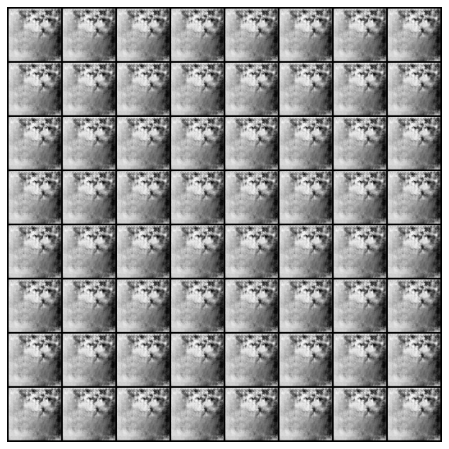

In [9]:
animate_gen_imgs()

# Trian : izif E

In [10]:
DC.eval()
D.eval()

kappa = 1.0
EC_losses = []

iters = 0
AE_img_list = []

def train_AE(epoch):
    global epochs
    global iters
    global EC_losses
    global AE_img_list
    
    # 인덱스 0부터 세기 시작
    # data[0].size():64x1x64x64(image) / data[1].size():64(label)
    for i,data in enumerate(data_loader,0):
        
        real_imgs = data[0].to(device)
        
        EC_optimizer.zero_grad()
        
        EC_validity = EC(real_imgs)
        
        fake_imgs = DC(EC_validity)
        
        _, real_features = D.forward(real_imgs)
        _, fake_features = D.forward(fake_imgs)
        
        
        # izif architecture
        imgs_loss = AE_criterion(real_imgs, fake_imgs)
        features_loss = AE_criterion(real_features, fake_features)
        EC_loss = imgs_loss + kappa*features_loss
        
        EC_loss.backward()
        EC_optimizer.step()
        
        # =============================================================
        # print
        # =============================================================
        print('[%d/%d][%d/%d]\n- E_loss: %.4f\n'
              %(epoch+1, epochs, i, len(data_loader), EC_loss.item()))
        
        # Save Losses for plotting later
        EC_losses.append(EC_loss.item())
        
        #Check how the generator is doing by saving G's output on noise_z
        if (iters % 500 == 0) or ((epoch == epochs-1) and (i == len(data_loader)-1)):
            with torch.no_grad():
                fake = DC(EC_validity).detach().cpu()
            AE_img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
            
        iters += 1
        
#torch.save(E.state_dict(), 'E.ckpt')

In [11]:
for epoch in range(epochs):
    train_AE(epoch)

[1/100][0/21]
- E_loss: 0.3065

[1/100][1/21]
- E_loss: 0.3265

[1/100][2/21]
- E_loss: 0.2818

[1/100][3/21]
- E_loss: 0.2977

[1/100][4/21]
- E_loss: 0.2971

[1/100][5/21]
- E_loss: 0.2928

[1/100][6/21]
- E_loss: 0.3350

[1/100][7/21]
- E_loss: 0.3087

[1/100][8/21]
- E_loss: 0.3048

[1/100][9/21]
- E_loss: 0.2802

[1/100][10/21]
- E_loss: 0.2993

[1/100][11/21]
- E_loss: 0.3315

[1/100][12/21]
- E_loss: 0.2713

[1/100][13/21]
- E_loss: 0.2974

[1/100][14/21]
- E_loss: 0.3083

[1/100][15/21]
- E_loss: 0.2946

[1/100][16/21]
- E_loss: 0.2843

[1/100][17/21]
- E_loss: 0.2467

[1/100][18/21]
- E_loss: 0.3093

[1/100][19/21]
- E_loss: 0.2960

[1/100][20/21]
- E_loss: 0.2760

[2/100][0/21]
- E_loss: 0.3175

[2/100][1/21]
- E_loss: 0.3128

[2/100][2/21]
- E_loss: 0.2833

[2/100][3/21]
- E_loss: 0.2985

[2/100][4/21]
- E_loss: 0.3036

[2/100][5/21]
- E_loss: 0.2925

[2/100][6/21]
- E_loss: 0.2751

[2/100][7/21]
- E_loss: 0.3115

[2/100][8/21]
- E_loss: 0.3182

[2/100][9/21]
- E_loss: 0.300

[13/100][0/21]
- E_loss: 0.2663

[13/100][1/21]
- E_loss: 0.3368

[13/100][2/21]
- E_loss: 0.3284

[13/100][3/21]
- E_loss: 0.2817

[13/100][4/21]
- E_loss: 0.3076

[13/100][5/21]
- E_loss: 0.3167

[13/100][6/21]
- E_loss: 0.2636

[13/100][7/21]
- E_loss: 0.3070

[13/100][8/21]
- E_loss: 0.3001

[13/100][9/21]
- E_loss: 0.2990

[13/100][10/21]
- E_loss: 0.3044

[13/100][11/21]
- E_loss: 0.3346

[13/100][12/21]
- E_loss: 0.2820

[13/100][13/21]
- E_loss: 0.2918

[13/100][14/21]
- E_loss: 0.2844

[13/100][15/21]
- E_loss: 0.3075

[13/100][16/21]
- E_loss: 0.2871

[13/100][17/21]
- E_loss: 0.2837

[13/100][18/21]
- E_loss: 0.2688

[13/100][19/21]
- E_loss: 0.2770

[13/100][20/21]
- E_loss: 0.3014

[14/100][0/21]
- E_loss: 0.3043

[14/100][1/21]
- E_loss: 0.3010

[14/100][2/21]
- E_loss: 0.3044

[14/100][3/21]
- E_loss: 0.3081

[14/100][4/21]
- E_loss: 0.2594

[14/100][5/21]
- E_loss: 0.3055

[14/100][6/21]
- E_loss: 0.2817

[14/100][7/21]
- E_loss: 0.2759

[14/100][8/21]
- E_loss: 0.2936


[24/100][15/21]
- E_loss: 0.3006

[24/100][16/21]
- E_loss: 0.2936

[24/100][17/21]
- E_loss: 0.3078

[24/100][18/21]
- E_loss: 0.2947

[24/100][19/21]
- E_loss: 0.2944

[24/100][20/21]
- E_loss: 0.3112

[25/100][0/21]
- E_loss: 0.2936

[25/100][1/21]
- E_loss: 0.3109

[25/100][2/21]
- E_loss: 0.2885

[25/100][3/21]
- E_loss: 0.2941

[25/100][4/21]
- E_loss: 0.3056

[25/100][5/21]
- E_loss: 0.2802

[25/100][6/21]
- E_loss: 0.3057

[25/100][7/21]
- E_loss: 0.3103

[25/100][8/21]
- E_loss: 0.2839

[25/100][9/21]
- E_loss: 0.3426

[25/100][10/21]
- E_loss: 0.3162

[25/100][11/21]
- E_loss: 0.3009

[25/100][12/21]
- E_loss: 0.3096

[25/100][13/21]
- E_loss: 0.3055

[25/100][14/21]
- E_loss: 0.2719

[25/100][15/21]
- E_loss: 0.3018

[25/100][16/21]
- E_loss: 0.2591

[25/100][17/21]
- E_loss: 0.2769

[25/100][18/21]
- E_loss: 0.2879

[25/100][19/21]
- E_loss: 0.3039

[25/100][20/21]
- E_loss: 0.2946

[26/100][0/21]
- E_loss: 0.3050

[26/100][1/21]
- E_loss: 0.2669

[26/100][2/21]
- E_loss: 0

[36/100][9/21]
- E_loss: 0.3071

[36/100][10/21]
- E_loss: 0.2763

[36/100][11/21]
- E_loss: 0.2994

[36/100][12/21]
- E_loss: 0.2968

[36/100][13/21]
- E_loss: 0.3156

[36/100][14/21]
- E_loss: 0.2786

[36/100][15/21]
- E_loss: 0.3111

[36/100][16/21]
- E_loss: 0.2969

[36/100][17/21]
- E_loss: 0.3124

[36/100][18/21]
- E_loss: 0.3221

[36/100][19/21]
- E_loss: 0.3204

[36/100][20/21]
- E_loss: 0.2974

[37/100][0/21]
- E_loss: 0.2794

[37/100][1/21]
- E_loss: 0.2737

[37/100][2/21]
- E_loss: 0.2980

[37/100][3/21]
- E_loss: 0.3056

[37/100][4/21]
- E_loss: 0.3123

[37/100][5/21]
- E_loss: 0.2854

[37/100][6/21]
- E_loss: 0.2915

[37/100][7/21]
- E_loss: 0.3067

[37/100][8/21]
- E_loss: 0.3014

[37/100][9/21]
- E_loss: 0.2741

[37/100][10/21]
- E_loss: 0.3122

[37/100][11/21]
- E_loss: 0.3273

[37/100][12/21]
- E_loss: 0.2968

[37/100][13/21]
- E_loss: 0.2935

[37/100][14/21]
- E_loss: 0.2822

[37/100][15/21]
- E_loss: 0.3102

[37/100][16/21]
- E_loss: 0.2968

[37/100][17/21]
- E_loss:

[48/100][3/21]
- E_loss: 0.3237

[48/100][4/21]
- E_loss: 0.2830

[48/100][5/21]
- E_loss: 0.3197

[48/100][6/21]
- E_loss: 0.3072

[48/100][7/21]
- E_loss: 0.2751

[48/100][8/21]
- E_loss: 0.3220

[48/100][9/21]
- E_loss: 0.2983

[48/100][10/21]
- E_loss: 0.3366

[48/100][11/21]
- E_loss: 0.2939

[48/100][12/21]
- E_loss: 0.2868

[48/100][13/21]
- E_loss: 0.2994

[48/100][14/21]
- E_loss: 0.3181

[48/100][15/21]
- E_loss: 0.2984

[48/100][16/21]
- E_loss: 0.2714

[48/100][17/21]
- E_loss: 0.2489

[48/100][18/21]
- E_loss: 0.2920

[48/100][19/21]
- E_loss: 0.2869

[48/100][20/21]
- E_loss: 0.3048

[49/100][0/21]
- E_loss: 0.3025

[49/100][1/21]
- E_loss: 0.3064

[49/100][2/21]
- E_loss: 0.2733

[49/100][3/21]
- E_loss: 0.3016

[49/100][4/21]
- E_loss: 0.2771

[49/100][5/21]
- E_loss: 0.3316

[49/100][6/21]
- E_loss: 0.2773

[49/100][7/21]
- E_loss: 0.3106

[49/100][8/21]
- E_loss: 0.3184

[49/100][9/21]
- E_loss: 0.2801

[49/100][10/21]
- E_loss: 0.3158

[49/100][11/21]
- E_loss: 0.293

[59/100][18/21]
- E_loss: 0.3312

[59/100][19/21]
- E_loss: 0.2906

[59/100][20/21]
- E_loss: 0.3166

[60/100][0/21]
- E_loss: 0.3078

[60/100][1/21]
- E_loss: 0.2680

[60/100][2/21]
- E_loss: 0.2593

[60/100][3/21]
- E_loss: 0.2916

[60/100][4/21]
- E_loss: 0.3285

[60/100][5/21]
- E_loss: 0.3046

[60/100][6/21]
- E_loss: 0.2623

[60/100][7/21]
- E_loss: 0.3197

[60/100][8/21]
- E_loss: 0.3152

[60/100][9/21]
- E_loss: 0.2872

[60/100][10/21]
- E_loss: 0.3061

[60/100][11/21]
- E_loss: 0.2861

[60/100][12/21]
- E_loss: 0.3085

[60/100][13/21]
- E_loss: 0.3016

[60/100][14/21]
- E_loss: 0.2919

[60/100][15/21]
- E_loss: 0.3229

[60/100][16/21]
- E_loss: 0.2991

[60/100][17/21]
- E_loss: 0.2755

[60/100][18/21]
- E_loss: 0.2788

[60/100][19/21]
- E_loss: 0.3018

[60/100][20/21]
- E_loss: 0.3048

[61/100][0/21]
- E_loss: 0.3307

[61/100][1/21]
- E_loss: 0.2998

[61/100][2/21]
- E_loss: 0.2911

[61/100][3/21]
- E_loss: 0.2753

[61/100][4/21]
- E_loss: 0.2940

[61/100][5/21]
- E_loss: 0.29

[71/100][12/21]
- E_loss: 0.2769

[71/100][13/21]
- E_loss: 0.3124

[71/100][14/21]
- E_loss: 0.2940

[71/100][15/21]
- E_loss: 0.2930

[71/100][16/21]
- E_loss: 0.2706

[71/100][17/21]
- E_loss: 0.3336

[71/100][18/21]
- E_loss: 0.2886

[71/100][19/21]
- E_loss: 0.2778

[71/100][20/21]
- E_loss: 0.2884

[72/100][0/21]
- E_loss: 0.3283

[72/100][1/21]
- E_loss: 0.3273

[72/100][2/21]
- E_loss: 0.3132

[72/100][3/21]
- E_loss: 0.3045

[72/100][4/21]
- E_loss: 0.3278

[72/100][5/21]
- E_loss: 0.3324

[72/100][6/21]
- E_loss: 0.2871

[72/100][7/21]
- E_loss: 0.2764

[72/100][8/21]
- E_loss: 0.3014

[72/100][9/21]
- E_loss: 0.2643

[72/100][10/21]
- E_loss: 0.2784

[72/100][11/21]
- E_loss: 0.2852

[72/100][12/21]
- E_loss: 0.2552

[72/100][13/21]
- E_loss: 0.2856

[72/100][14/21]
- E_loss: 0.2768

[72/100][15/21]
- E_loss: 0.3071

[72/100][16/21]
- E_loss: 0.2750

[72/100][17/21]
- E_loss: 0.2982

[72/100][18/21]
- E_loss: 0.2894

[72/100][19/21]
- E_loss: 0.3028

[72/100][20/21]
- E_loss

[83/100][6/21]
- E_loss: 0.2793

[83/100][7/21]
- E_loss: 0.2746

[83/100][8/21]
- E_loss: 0.3171

[83/100][9/21]
- E_loss: 0.2967

[83/100][10/21]
- E_loss: 0.2900

[83/100][11/21]
- E_loss: 0.3288

[83/100][12/21]
- E_loss: 0.3233

[83/100][13/21]
- E_loss: 0.2771

[83/100][14/21]
- E_loss: 0.2503

[83/100][15/21]
- E_loss: 0.2903

[83/100][16/21]
- E_loss: 0.2890

[83/100][17/21]
- E_loss: 0.3225

[83/100][18/21]
- E_loss: 0.3006

[83/100][19/21]
- E_loss: 0.2741

[83/100][20/21]
- E_loss: 0.2968

[84/100][0/21]
- E_loss: 0.2675

[84/100][1/21]
- E_loss: 0.3002

[84/100][2/21]
- E_loss: 0.3066

[84/100][3/21]
- E_loss: 0.2847

[84/100][4/21]
- E_loss: 0.2574

[84/100][5/21]
- E_loss: 0.2957

[84/100][6/21]
- E_loss: 0.3310

[84/100][7/21]
- E_loss: 0.2925

[84/100][8/21]
- E_loss: 0.2694

[84/100][9/21]
- E_loss: 0.2904

[84/100][10/21]
- E_loss: 0.3044

[84/100][11/21]
- E_loss: 0.2973

[84/100][12/21]
- E_loss: 0.2988

[84/100][13/21]
- E_loss: 0.3398

[84/100][14/21]
- E_loss: 0.

[95/100][0/21]
- E_loss: 0.2685

[95/100][1/21]
- E_loss: 0.3182

[95/100][2/21]
- E_loss: 0.3218

[95/100][3/21]
- E_loss: 0.3195

[95/100][4/21]
- E_loss: 0.2762

[95/100][5/21]
- E_loss: 0.2922

[95/100][6/21]
- E_loss: 0.2519

[95/100][7/21]
- E_loss: 0.3110

[95/100][8/21]
- E_loss: 0.2993

[95/100][9/21]
- E_loss: 0.2899

[95/100][10/21]
- E_loss: 0.2920

[95/100][11/21]
- E_loss: 0.3009

[95/100][12/21]
- E_loss: 0.2912

[95/100][13/21]
- E_loss: 0.2818

[95/100][14/21]
- E_loss: 0.2879

[95/100][15/21]
- E_loss: 0.3161

[95/100][16/21]
- E_loss: 0.2892

[95/100][17/21]
- E_loss: 0.3002

[95/100][18/21]
- E_loss: 0.3118

[95/100][19/21]
- E_loss: 0.3022

[95/100][20/21]
- E_loss: 0.3031

[96/100][0/21]
- E_loss: 0.2712

[96/100][1/21]
- E_loss: 0.2731

[96/100][2/21]
- E_loss: 0.2966

[96/100][3/21]
- E_loss: 0.2849

[96/100][4/21]
- E_loss: 0.2921

[96/100][5/21]
- E_loss: 0.2816

[96/100][6/21]
- E_loss: 0.2884

[96/100][7/21]
- E_loss: 0.2864

[96/100][8/21]
- E_loss: 0.2853


# Loss Graph

In [12]:
def plot_train_loss():
    plt.figure(figsize=(10,5))
    plt.title("Generator and Discriminator Loss During Training")
    plt.plot(DC_losses, label="G")
    plt.plot(D_losses, label="D")
    plt.plot(EC_losses, label="E")
    plt.xlabel("iterations")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

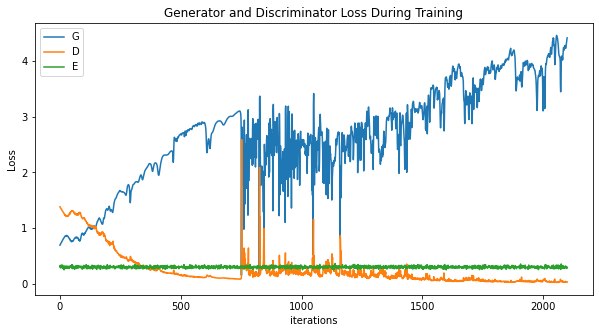

In [13]:
plot_train_loss()

---

# Test Data

In [14]:
#test_data_root = "../../dataset/test/test_DualPhaseSteel"
CFRP_test_data_root = "../../dataset/test/test_CFRP"

test_data_set = dataset.ImageFolder(root = CFRP_test_data_root, # test_data_root,
                           transform = transforms.Compose([
                                  transforms.Resize(img_size),
                                  transforms.CenterCrop(img_size),
                                  torchvision.transforms.Grayscale(channel),
                                  transforms.ToTensor(),
                                  transforms.Normalize((0.5,),(0.5,))
                              ]))

# 배치로 나누고 셔플하기
test_data_loader = torch.utils.data.DataLoader(test_data_set, batch_size = 1,
                                              shuffle = False, num_workers = workers)

# 이상 픽셀 수 확인 함수

In [15]:
def count_el_not_0(diff_img):
    count_el_not_0 = 0
    
    col_size = diff_img.shape[0]
    row_size = diff_img.shape[1]
    
    #print(col_size, row_size)
    
    for col in range(col_size):
        for row in range(row_size):
            if diff_img[col][row] != 0:
                count_el_not_0 += 1
                
    return count_el_not_0

# img 비교 함수

In [16]:
def compare_imgs(real_img, generated_img, i, score, reverse=False, threshold=50):
    real_img = real_img.cpu().data.numpy().reshape(img_size, img_size) * 255
    generated_img = generated_img.cpu().data.numpy().reshape(img_size, img_size) * 255
    
    negative = np.zeros_like(real_img)

    if not reverse:
        diff_img = real_img - generated_img
    else:
        diff_img = generated_img - real_img

    diff_img[diff_img <= threshold] = 0

    # 분율 추출
    diff_cnts.append(count_el_not_0(diff_img))
    # 분산 추출
    diff_points.append(np.where(diff_img > threshold))
    
    anomaly_img = np.zeros(shape=(img_size, img_size, 3))
    anomaly_img[:, :, 0] = real_img - diff_img
    anomaly_img[:, :, 1] = real_img - diff_img
    anomaly_img[:, :, 2] = real_img - diff_img
    anomaly_img[:, :, 0] = anomaly_img[:,:,0] + diff_img
    anomaly_img = anomaly_img.astype(np.uint8)

    # anomaly_img 추출
    anomaly_imgs.append(anomaly_img)
    
    fig, plots = plt.subplots(1, 4)

    fig.suptitle(f'Anomaly - (anomaly score: {score:.4})')
    
    fig.set_figwidth(9)
    fig.set_tight_layout(True)
    plots = plots.reshape(-1)
    plots[0].imshow(real_img, cmap='gray', label = "real")
    plots[1].imshow(generated_img, cmap='gray')
    plots[2].imshow(diff_img, cmap='gray')
    plots[3].imshow(anomaly_img)
    
    plots[0].set_title('real')
    plots[1].set_title('generated')
    plots[2].set_title('difference')
    plots[3].set_title('Anomaly Detection')
    plt.show()

# Test

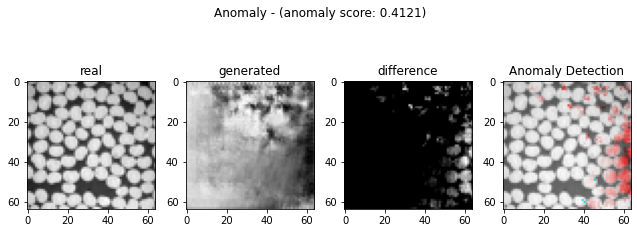

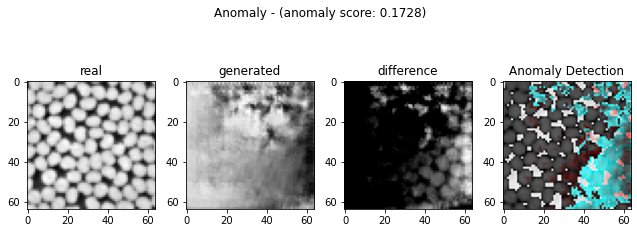

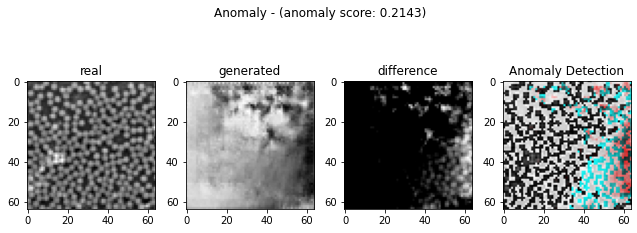

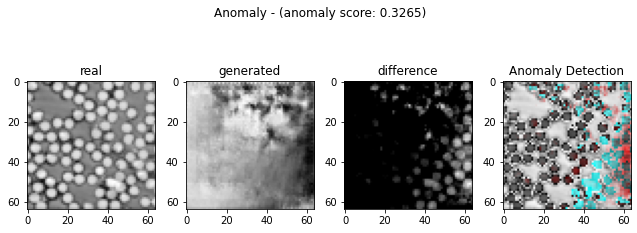

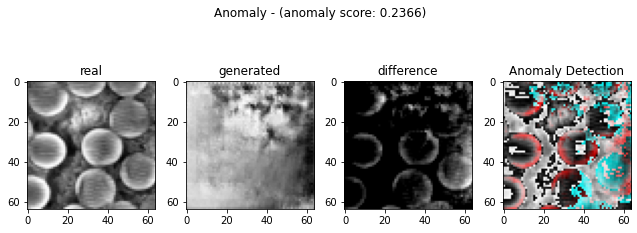

...

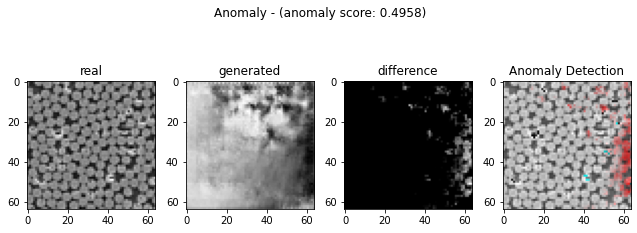

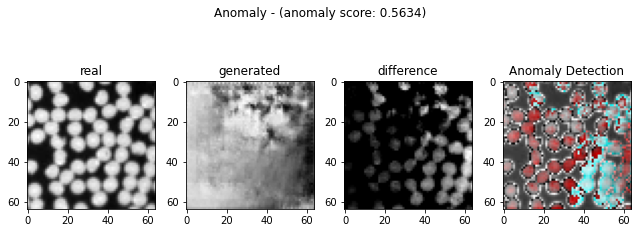

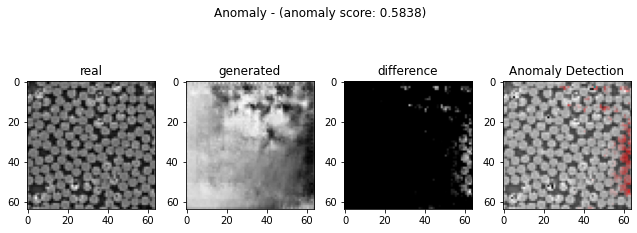

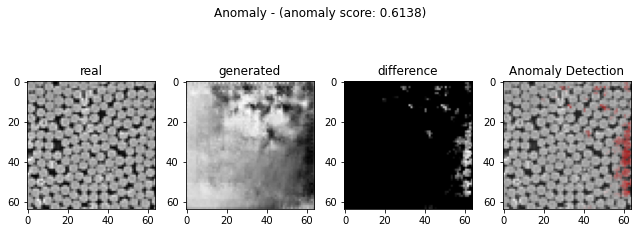

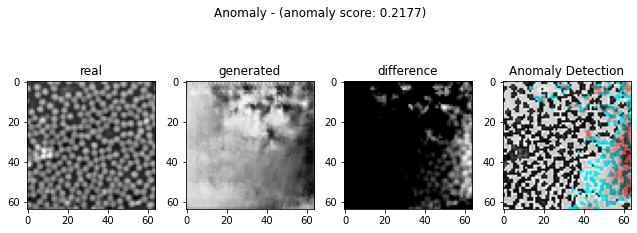

In [17]:
diff_cnts = []
diff_points = []
anomaly_imgs = []

ano_criterion = nn.MSELoss()
DC.eval()
D.eval()
EC.eval()

# with open("score.csv", "w") as f:
#         f.write("label,img_distance,anomaly_score,z_distance\n")

for i, data in enumerate(test_data_loader, 0):
    real_img = data[0].to(device)

    real_z = EC(real_img) # 진짜 이미지의 latent vector
    fake_img = DC(real_z) # DC에 넣어서 가짜 이미지 생성.
    fake_z = EC(fake_img) # torch.Size([1, 100]) --> latent 진짜 이미지와 매핑된 가짜 이미지의 latent vector

    _, real_feature = D.forward(real_img) # 1, 256
    _, fake_feature = D.forward(fake_img)

    img_distance = ano_criterion(fake_img, real_img)
    loss_feature = ano_criterion(fake_feature, real_feature)

    anomaly_score = img_distance + kappa*loss_feature

    z_distance = ano_criterion(fake_z, real_z)
    
#     with open("score.csv", "a") as f:
#             f.write(f"{label.item()},{img_distance},"
#                     f"{anomaly_score},{z_distance}\n")
            
#     print(f"{label.item()}, {img_distance}, "
#           f"{anomaly_score}, {z_distance}\n")
    compare_imgs(real_img, fake_img, i, anomaly_score, reverse = False, threshold = 0.3)

---

# 분율 추출

In [18]:
diff_cnts = np.array(diff_cnts)

diff_fraction = diff_cnts / img_size ** 2

print(diff_fraction)

[0.16894531 0.43798828 0.29125977 0.29077148 0.43310547 0.22387695
 0.51953125 0.4934082  0.28710938 0.31591797 0.1496582  0.14404297
 0.28637695 0.33129883 0.50366211 0.15258789 0.2734375  0.2487793
 0.2043457  0.33520508 0.19702148 0.25512695 0.39306641 0.11450195
 0.35717773 0.30419922 0.38720703 0.31762695 0.37475586 0.3984375
 0.31616211 0.29296875 0.39868164 0.22119141 0.47851562 0.28710938
 0.52709961 0.16308594 0.37988281 0.41210938 0.09570312 0.33813477
 0.20996094 0.08496094 0.43847656 0.57617188 0.12255859 0.33886719
 0.09912109 0.37573242 0.70385742 0.09057617 0.04101562 0.26806641
 0.42773438 0.12524414 0.45043945 0.09057617 0.08422852 0.29272461]


In [19]:
sum(diff_fraction)/len(diff_fraction)

0.29868977864583335

---

# 분산 추출

In [20]:
from scipy import stats
from extended_int import int_inf

corr_coeffis = []
corr_p_vals = []

def cal_corr_coeffis():
    for idx in range(len(test_data_loader)):
        x_points = diff_points[idx][0]
        y_points = diff_points[idx][1]
        
        
        if len(x_points) > 0:
            corr_coeffi, corr_p_val = stats.pearsonr(x_points, y_points)
        else:
            corr_coeffi, corr_p_val = -int_inf, -int_inf
        
        corr_coeffis.append(corr_coeffi)
        corr_p_vals.append(corr_p_val)

In [21]:
cal_corr_coeffis()

print(corr_coeffis)

[0.2194024836427096, 0.08212670802705702, 0.166919216214945, 0.10536797949255555, 0.023056199302121674, 0.12599438901608656, 0.0500572662060872, 0.0009952700966949207, 0.10778739973755251, 0.1732047238698668, 0.03308993442222723, 0.2901677541688118, 0.21994089395897154, 0.16227715444940338, 0.14682214775447133, 0.43851646948870904, 0.17532015641494572, 0.2138251367562876, 0.25951524474929805, 0.18953382809904068, 0.11084649357402471, 0.07440341487329521, 0.08652024309480902, -0.10224406872443476, 0.12394203055232997, 0.08180118587797215, 0.08880447709968306, 0.14412365617285444, 0.1213672384009438, -0.035470812875942656, 0.1375990668290934, 0.1924752996850682, 0.08672721329954829, 0.2786619686177459, 0.12734267707218644, 0.1815786173954923, 0.03916762961044572, 0.23631264950604117, 0.020611315348075202, 0.07265121263704213, 0.4494702305411612, 0.1278427003320211, 0.18472549865209048, 0.41092536128021184, 0.04994160716120621, 0.04195972647059906, 0.3292764070442186, 0.09694641863262993,

---

# 모델 저장 및 읽기

In [22]:
save_file = "./pretrained/pretrained.pth"

def save_pretrained():
    pretrained = {
        "D" : D.state_dict(),
        "DC" : DC.state_dict(),
        "EC" : EC.state_dict()
    }

    if not os.path.isdir("pretrained"):
        os.mkdir("pretrained")
    torch.save(pretrained, save_file)

In [23]:
save_pretrained()

In [24]:
pretrained_D = Discriminator().to(device)
pretrained_DC = Decoder().to(device)
pretrained_EC = Encoder().to(device)

def load_pretrained():
    global pretrained_D
    global pretrained_DC
    global pretrained_EC
    
    assert os.path.isdir("pretrained"), "Error : no pretrained dir found!"
    
    pretrained = torch.load(save_file)
    
    pretrained_D.load_state_dict(pretrained["D"])
    pretrained_DC.load_state_dict(pretrained["DC"])
    pretrained_EC.load_state_dict(pretrained["EC"])
    
    #print("pretrained_D :", pretrained_D)
    #print("pretrained_G :", pretrained_DC)
    #print("pretrained_E :", pretrained_EC)

In [25]:
load_pretrained()

In [26]:
def test():
    ano_criterion = nn.MSELoss()
    pretrained_DC.eval()
    pretrained_D.eval()
    pretrained_EC.eval()

    # with open("score.csv", "w") as f:
    #         f.write("label,img_distance,anomaly_score,z_distance\n")

    for i, data in enumerate(test_data_loader, 0):
        real_img = data[0].to(device)

        real_z = pretrained_EC(real_img) # 진짜 이미지의 latent vector
        fake_img = pretrained_DC(real_z) # DC에 넣어서 가짜 이미지 생성.
        fake_z = pretrained_EC(fake_img) # torch.Size([1, 100]) --> latent 진짜 이미지와 매핑된 가짜 이미지의 latent vector

        _, real_feature = pretrained_D.forward(real_img) # 1, 256
        _, fake_feature = pretrained_D.forward(fake_img)

        img_distance = ano_criterion(fake_img, real_img)
        loss_feature = ano_criterion(fake_feature, real_feature)

        anomaly_score = img_distance + kappa*loss_feature

        z_distance = ano_criterion(fake_z, real_z)

    #     with open("score.csv", "a") as f:
    #             f.write(f"{label.item()},{img_distance},"
    #                     f"{anomaly_score},{z_distance}\n")

    #     print(f"{label.item()}, {img_distance}, "
    #           f"{anomaly_score}, {z_distance}\n")
        compare_imgs(real_img, fake_img, i, anomaly_score, reverse = False, threshold = 0.3)

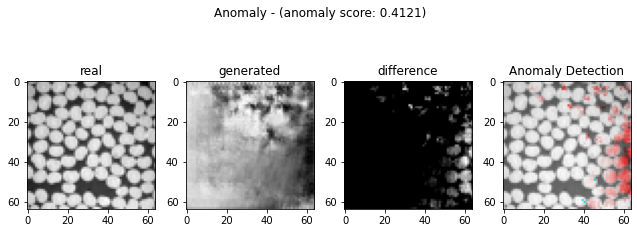

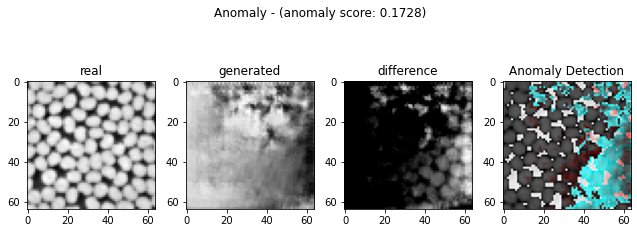

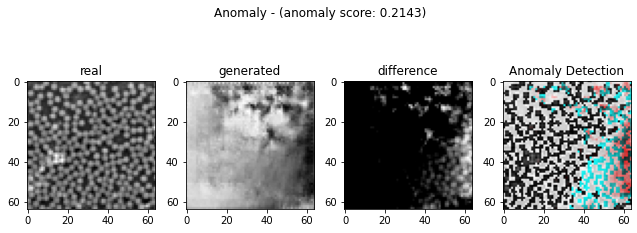

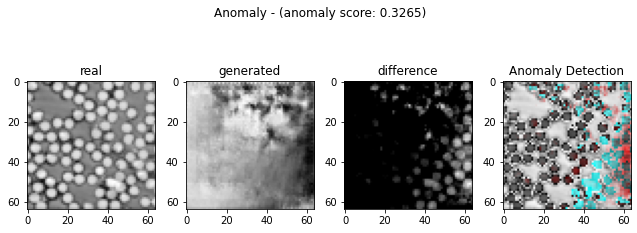

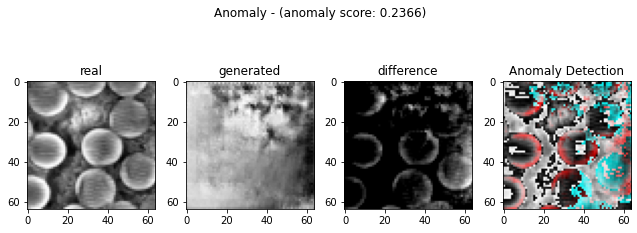

...

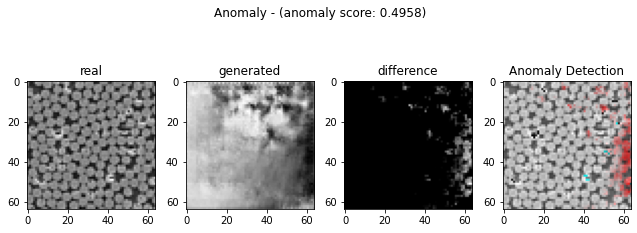

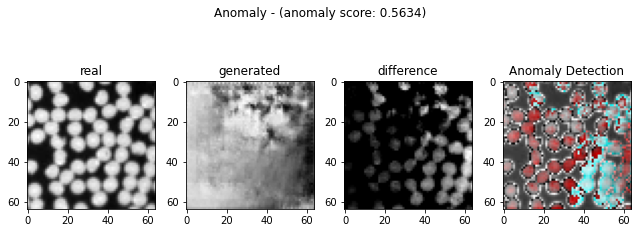

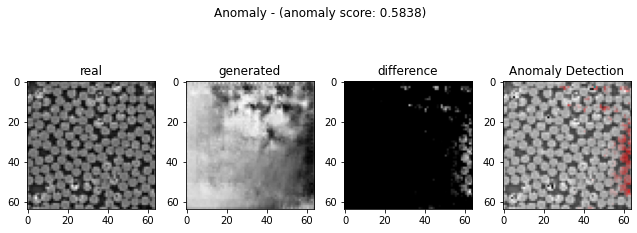

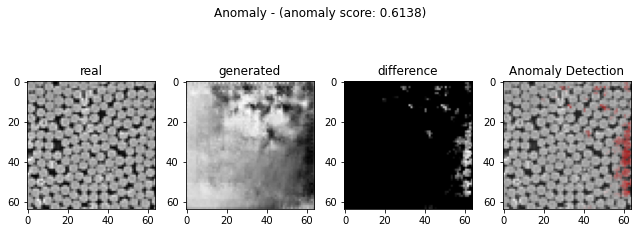

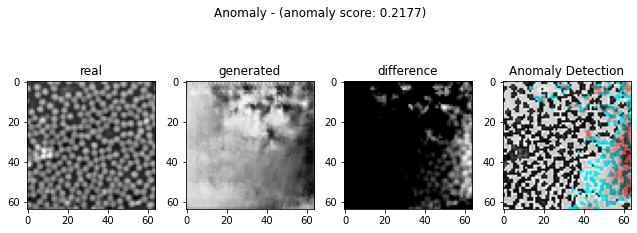

In [27]:
diff_cnts = []
diff_points = []
anomaly_imgs = []

corr_coeffis = []
corr_p_vals = []

test()

In [28]:
diff_cnts = np.array(diff_cnts)

diff_fraction = diff_cnts / img_size ** 2

print(diff_fraction)

[0.16894531 0.43798828 0.29125977 0.29077148 0.43310547 0.22387695
 0.51953125 0.4934082  0.28710938 0.31591797 0.1496582  0.14404297
 0.28637695 0.33129883 0.50366211 0.15258789 0.2734375  0.2487793
 0.2043457  0.33520508 0.19702148 0.25512695 0.39306641 0.11450195
 0.35717773 0.30419922 0.38720703 0.31762695 0.37475586 0.3984375
 0.31616211 0.29296875 0.39868164 0.22119141 0.47851562 0.28710938
 0.52709961 0.16308594 0.37988281 0.41210938 0.09570312 0.33813477
 0.20996094 0.08496094 0.43847656 0.57617188 0.12255859 0.33886719
 0.09912109 0.37573242 0.70385742 0.09057617 0.04101562 0.26806641
 0.42773438 0.12524414 0.45043945 0.09057617 0.08422852 0.29272461]


In [29]:
cal_corr_coeffis()

print(corr_coeffis)

[0.2194024836427096, 0.08212670802705702, 0.166919216214945, 0.10536797949255555, 0.023056199302121674, 0.12599438901608656, 0.0500572662060872, 0.0009952700966949207, 0.10778739973755251, 0.1732047238698668, 0.03308993442222723, 0.2901677541688118, 0.21994089395897154, 0.16227715444940338, 0.14682214775447133, 0.43851646948870904, 0.17532015641494572, 0.2138251367562876, 0.25951524474929805, 0.18953382809904068, 0.11084649357402471, 0.07440341487329521, 0.08652024309480902, -0.10224406872443476, 0.12394203055232997, 0.08180118587797215, 0.08880447709968306, 0.14412365617285444, 0.1213672384009438, -0.035470812875942656, 0.1375990668290934, 0.1924752996850682, 0.08672721329954829, 0.2786619686177459, 0.12734267707218644, 0.1815786173954923, 0.03916762961044572, 0.23631264950604117, 0.020611315348075202, 0.07265121263704213, 0.4494702305411612, 0.1278427003320211, 0.18472549865209048, 0.41092536128021184, 0.04994160716120621, 0.04195972647059906, 0.3292764070442186, 0.09694641863262993,

---

# anomaly detection 이미지 추출

In [30]:
anomaly_imgs

[array([[[188, 188, 188],
         [192, 192, 192],
         [194, 194, 194],
         ...,
         [180, 180, 180],
         [186, 186, 186],
         [186, 186, 186]],
 
        [[136, 136, 136],
         [180, 180, 180],
         [182, 182, 182],
         ...,
         [190, 111, 111],
         [184, 184, 184],
         [188, 188, 188]],
 
        [[186, 186, 186],
         [180, 180, 180],
         [127, 127, 127],
         ...,
         [188, 114, 114],
         [184, 151, 151],
         [190, 190, 190]],
 
        ...,
 
        [[180, 180, 180],
         [206, 206, 206],
         [206, 206, 206],
         ...,
         [226, 226, 226],
         [232, 232, 232],
         [150, 150, 150]],
 
        [[172, 172, 172],
         [113, 113, 113],
         [198, 198, 198],
         ...,
         [228, 228, 228],
         [218, 218, 218],
         [166, 166, 166]],
 
        [[188, 188, 188],
         [166, 166, 166],
         [222, 222, 222],
         ...,
         [226, 226, 226],
  

# 이미지 저장 함수

In [31]:
import cv2

def save_imgs(folder, imgs):
    if not os.path.isdir("anomaly_imgs"):
        os.mkdir("anomaly_imgs")
    
    for i in range(len(imgs)):
        cv2.imwrite('%s/%d.png' %(folder,i), imgs[i]) #이미지 저장할 경로 설정을 여기서 한다.
    print("image saving complete")

In [32]:
save_imgs("./anomaly_imgs", anomaly_imgs)

image saving complete


---

# 티타늄(Ti64) 상대 밀도 계산

In [33]:
Ti64_density = 4.43

Ti64_rel_densitys = np.array([])

Ti64_rel_densitys = diff_fraction * Ti64_density

print(Ti64_rel_densitys)

[0.74842773 1.94028809 1.29028076 1.28811768 1.91865723 0.9917749
 2.30152344 2.18579834 1.27189453 1.3995166  0.66298584 0.63811035
 1.2686499  1.46765381 2.23122314 0.67596436 1.21132812 1.10209229
 0.90525146 1.4849585  0.87280518 1.1302124  1.74128418 0.50724365
 1.58229736 1.34760254 1.71532715 1.4070874  1.66016846 1.76507812
 1.40059814 1.29785156 1.76615967 0.97987793 2.11982422 1.27189453
 2.33505127 0.7224707  1.68288086 1.82564453 0.42396484 1.49793701
 0.93012695 0.37637695 1.94245117 2.55244141 0.54293457 1.50118164
 0.43910645 1.66449463 3.11808838 0.40125244 0.18169922 1.18753418
 1.89486328 0.55483154 1.99544678 0.40125244 0.37313232 1.29677002]
